In [13]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [22]:
import pandas
import copy
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import seaborn as sbn
import sys
import matplotlib.pyplot as plt


# show all elements of a dataframe
# pandas.set_option("display.max_rows", None)
pandas.set_option("display.max_columns", None)


sys.path.append("../../src/")

In [23]:
RANDOM_STATE = 42

In [24]:
from classification_utility import *


## Balancing classes

In [26]:
train_set, test_set, train_label, test_label = train_test_for_distance()

In [27]:
print(f'TRAINING: {train_set.shape[0]} - {train_label.shape[0]}')
print(f'TEST: {test_set.shape[0]} - {test_label.shape[0]}')

TRAINING: 476478 - 476478
TEST: 32586 - 32586


In [28]:
train_set.head()

,cyclist_age,race_year,points,length,climb_total,startlist_quality,BMI,AVG position_2021,# cyclist races_2021,std_dev position_2021,geo area_Africa,geo area_America,geo area_Asia,geo area_Eastern Europe,geo area_Northern Europe,geo area_Oceania,geo area_Southern Europe,geo area_Western Europe
0,-1.141184,-2.988317,2.457905,1.126943,0.248058,-1.884112,0.663382,-2.767308,-1.393337,-2.726005,False,False,False,False,False,False,False,True
1,-0.593687,-2.988317,2.457905,1.126943,0.248058,-1.884112,-1.940399,-2.898994,-1.580086,-3.940957,False,False,False,False,False,False,False,True
2,-1.414933,-2.988317,2.457905,1.126943,0.248058,-1.884112,1.260706,-2.635622,-1.185838,-2.777915,False,False,False,False,False,False,False,True
3,-1.141184,-2.988317,2.457905,1.126943,0.248058,-1.884112,0.427759,-3.030679,-1.386420,-3.976033,False,False,False,False,False,False,False,True
4,-1.414933,-2.988317,2.457905,1.126943,0.248058,-1.884112,1.174634,-2.460041,-1.600835,-3.742795,False,False,False,False,False,False,False,True


In [29]:
test_set.head()

,cyclist_age,race_year,points,length,climb_total,startlist_quality,BMI,AVG position_2021,# cyclist races_2021,std_dev position_2021,geo area_Africa,geo area_America,geo area_Asia,geo area_Eastern Europe,geo area_Northern Europe,geo area_Oceania,geo area_Southern Europe,geo area_Western Europe
3632,1.048805,1.388813,2.457905,1.345486,0.894463,-1.019428,0.581254,-0.923707,1.117398,1.153655,False,False,False,True,False,False,False,False
3633,-0.319938,1.388813,2.457905,1.345486,0.894463,-1.019428,-0.861626,0.612627,-0.964506,0.604729,False,False,False,False,False,False,False,True
3634,-0.046189,1.388813,2.457905,1.345486,0.894463,-1.019428,-0.953238,-1.450450,-0.182927,-0.072940,False,False,False,False,False,False,False,True
3635,-0.319938,1.388813,2.457905,1.345486,0.894463,-1.019428,0.733940,-2.284460,-1.338004,-1.256347,False,False,False,False,False,False,False,True
3636,0.227559,1.388813,2.457905,1.345486,0.894463,-1.019428,0.153734,0.919893,-1.393337,0.529970,False,False,False,False,True,False,False,False


In [30]:
TR_set_std, VD_set_std, TR_label_std, VD_label_std=split_in_train_and_validation(train_set, train_label)
print(f'TRAINING: {TR_set_std.shape[0]} - {TR_label_std.shape[0]}')
print(f'VALIDATION: {VD_set_std.shape[0]} - {VD_label_std.shape[0]}')
print(f'TEST: {test_set.shape[0]} - {test_label.shape[0]}')

TRAINING: 333534 - 333534
VALIDATION: 142944 - 142944
TEST: 32586 - 32586


In [31]:
test_set.isna().sum()

cyclist_age                 0
race_year                   0
points                      0
length                      0
climb_total                 0
startlist_quality           0
BMI                         0
AVG position_2021           0
# cyclist races_2021        0
std_dev position_2021       0
geo area_Africa             0
geo area_America            0
geo area_Asia               0
geo area_Eastern Europe     0
geo area_Northern Europe    0
geo area_Oceania            0
geo area_Southern Europe    0
geo area_Western Europe     0
dtype: int64

In [32]:
TR_label_std.value_counts(True)

top20
0    0.844592
1    0.155408
Name: proportion, dtype: float64

In [33]:
VD_label_std.value_counts(True)

top20
0    0.844589
1    0.155411
Name: proportion, dtype: float64

We see that the classes are strongly unbalanced. We need to use some technique to balance them.

### Undersampling

#### Random Undersampling

In [34]:
from imblearn.under_sampling import RandomUnderSampler

rand_undersampler=RandomUnderSampler(random_state=RANDOM_STATE, sampling_strategy=0.67)
train_set_us, train_label_us = rand_undersampler.fit_resample(train_set, train_label)

In [35]:
print(f'TRAINING: {train_set_us.shape[0]} - {train_label_us.shape[0]}')
print(f'TEST: {test_set.shape[0]} - {test_label.shape[0]}')

TRAINING: 184569 - 184569
TEST: 32586 - 32586


In [36]:
TR_set_us, VD_set_us, TR_label_us, VD_label_us=split_in_train_and_validation(train_set_us, train_label_us)
print(f'TRAINING: {TR_set_us.shape[0]} - {TR_label_us.shape[0]}')
print(f'VALIDATION: {VD_set_us.shape[0]} - {VD_label_us.shape[0]}')
print(f'TEST: {test_set.shape[0]} - {test_label.shape[0]}')

TRAINING: 129198 - 129198
VALIDATION: 55371 - 55371
TEST: 32586 - 32586


In [37]:
TR_label_us.value_counts(True)

top20
0    0.598802
1    0.401198
Name: proportion, dtype: float64

In [38]:
VD_label_us.value_counts(True)

top20
0    0.598797
1    0.401203
Name: proportion, dtype: float64

### Oversampling

#### SMOTE

In [40]:
from imblearn.over_sampling import SMOTE
smote_oversampler = SMOTE(k_neighbors=5,sampling_strategy=0.67, random_state=RANDOM_STATE)
train_set_smote, train_label_smote = smote_oversampler.fit_resample(train_set, train_label)

In [41]:
print(f'TRAINING: {train_set_smote.shape[0]} - {train_label_smote.shape[0]}')
print(f'TEST: {train_set.shape[0]} - {test_label.shape[0]}')

TRAINING: 672056 - 672056
TEST: 476478 - 32586


In [42]:
TR_set_smote, VD_set_smote, TR_label_smote, VD_label_smote=split_in_train_and_validation(train_set_smote, train_label_smote)
print(f'TRAINING: {TR_set_smote.shape[0]} - {TR_label_smote.shape[0]}')
print(f'VALIDATION: {VD_set_smote.shape[0]} - {VD_label_smote.shape[0]}')
print(f'TEST: {test_set.shape[0]} - {test_label.shape[0]}')

TRAINING: 470439 - 470439
VALIDATION: 201617 - 201617
TEST: 32586 - 32586


In [43]:
TR_label_smote.value_counts(True)

top20
0    0.598802
1    0.401198
Name: proportion, dtype: float64

In [44]:
VD_label_smote.value_counts(True)

top20
0    0.598804
1    0.401196
Name: proportion, dtype: float64

#### Random Oversampling

In [46]:
from imblearn.over_sampling import RandomOverSampler
rand_oversampler=RandomOverSampler(random_state=RANDOM_STATE, sampling_strategy=0.67)

In [47]:
train_set_os, train_label_os = rand_oversampler.fit_resample(train_set, train_label)

In [48]:
print(f'TRAINING: {train_set_os.shape[0]} - {train_label_os.shape[0]}')
print(f'TEST: {test_set.shape[0]} - {test_label.shape[0]}')

TRAINING: 672056 - 672056
TEST: 32586 - 32586


In [49]:
TR_set_os, VD_set_os, TR_label_os, VD_label_os=split_in_train_and_validation(train_set_os, train_label_os)
print(f'TRAINING: {TR_set_os.shape[0]} - {TR_label_os.shape[0]}')
print(f'VALIDATION: {VD_set_os.shape[0]} - {VD_label_os.shape[0]}')
print(f'TEST: {test_set.shape[0]} - {test_label.shape[0]}')

TRAINING: 470439 - 470439
VALIDATION: 201617 - 201617
TEST: 32586 - 32586


In [50]:
TR_label_os.value_counts(True)

top20
0    0.598802
1    0.401198
Name: proportion, dtype: float64

In [51]:
VD_label_os.value_counts(True)

top20
0    0.598804
1    0.401196
Name: proportion, dtype: float64

## NN


For better efficiency, a Neural Network requires the dataset to contain only numeric columns, ideally in float format. Therefore, we have to convert the boolean columns to numeric in both train and test sets.

In [53]:
bool_columns = train_set.select_dtypes(include='bool').columns
bool_columns

Index(['geo area_Africa', 'geo area_America', 'geo area_Asia',
       'geo area_Eastern Europe', 'geo area_Northern Europe',
       'geo area_Oceania', 'geo area_Southern Europe',
       'geo area_Western Europe'],
      dtype='object')

In [276]:
train_set[bool_columns] = train_set[bool_columns].astype(float)
test_set[bool_columns] = test_set[bool_columns].astype(float)

In [293]:
TR_set_std[bool_columns] = TR_set_std[bool_columns].astype(float)
VD_set_std[bool_columns] = VD_set_std[bool_columns].astype(float)

In [277]:
train_set_smote[bool_columns] = train_set_smote[bool_columns].astype(float)
TR_set_smote[bool_columns] = TR_set_smote[bool_columns].astype(float)
VD_set_smote[bool_columns] = VD_set_smote[bool_columns].astype(float)

In [278]:
train_set_us[bool_columns] = train_set_us[bool_columns].astype(float)
TR_set_us[bool_columns] = TR_set_us[bool_columns].astype(float)
VD_set_us[bool_columns] = VD_set_us[bool_columns].astype(float)


In [279]:
train_set_os[bool_columns] = train_set_os[bool_columns].astype(float)
TR_set_os[bool_columns] = TR_set_os[bool_columns].astype(float)
VD_set_os[bool_columns] = VD_set_os[bool_columns].astype(float)


In [280]:
models_std = [] # used to store all the models trained on the original dataset
predictions_std = [] # used to store all the labels predicted by these models on the validation set

In [281]:
models_os = [] # used to store all the models trained on the dataset oversampled with RandomSampling
predictions_os = [] # used to store all the labels predicted by these models on the validation set

In [282]:
models_sm= [] # used to store all the models trained on the dataset oversampled with SMOTE
predictions_sm = [] # used to store all the labels predicted by these models on the validation set

In [283]:
models_us= [] # used to store all the models trained on the dataset undersampled with RandomUndersampling
predictions_us = [] # used to store all the labels predicted by these models on the validation set

In [57]:
from tensorflow import keras
from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from keras import Sequential, regularizers
from keras.layers import Dense, Dropout, Flatten, BatchNormalization


A **Sequential mode**l is appropriate for a plain stack of layers where each layer has exactly one input tensor and one output tensor.

- **Flatten** layer: reshapes a multi-dimensional input into a 1D vector while preserving the batch size.

- **Dense** layer: is a fully connected layer where each neuron is connected to every neuron in the previous layer. <br> It has two main parameters: 
  - *units*: number of neurons in each layer.
  - *activation*: the function applied to the output layer.
  
- **Dropout** layer: randomly sets a fraction of its input units to 0 at each update during training to prevent *overfitting*.
  
Different types of activation functions, the most used:
  - **Sigmoid**: 
    - function: $f(x) = \frac{1}{1 + e^{-x}}$.
    - range: [0,1]
  
  - **ReLU**:
    - function: $ f(x) = \max(0, x) $
    - range: [0, $\infty$]

  - **Tanh**: 
    - fuction: $ f(x) = \frac{e^x - e^{-x}}{e^x + e^{-x}} $
    - range: [-1,1]
  
Since Sigmoid and Tanh activation functions often suffer from the *vanishing gradient problem*, we will use the ReLU activation function for dense layers, as it is less prone to this issue and is also the most commonly used activation function in modern deep learning models.

### Models trained on the original unbalanced dataset

In [54]:
train_set.shape

(476478, 18)

In [55]:
TR_set_std.shape

(333534, 18)

We start by testing a baseline NN model to establish a reference point for performance evaluation.

In [58]:
model_0 = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set.shape[1])),
  keras.layers.Dense(128, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In the following code, we train the model defined above for binary classification while tuning key hyperparameters, including:
- **Optimizer**: adjust the model weights to minimize the loss. Here, we test both standard Adamax and Adam with custom learning rate value.
  
- **Loss function**: binary crossentropy is applied, as it measures the error for binary classification tasks by comparing predicted probabilities to actual labels.

- **Early Stopping**: prevents overfitting by stopping training early when the validation loss stops improving. We chose a patience of 20, which means that training will stop if the validation loss does not improve for 20 consecutive epochs.

- **Class Weights**: in some configurations, we used weights to help balance class distributions, assigning higher weights to underrepresented classes, thus improving the fairness of the model.

- **Batch Size**: determines the number of samples processed before updating weights. For larger datasets, an higher value is indicated.

- **Validation Split**: we chose a value of 0.3 because our dataset is quite large. This ensures that the validation set has enough representation of the data to provide a reliable assessment of the model’s performance.
  

In [288]:
from sklearn.utils import compute_class_weight

# lr: learnig_rate
# bs: batch_size
# es_p: early stopping patience
# weights: by default True
def fit_NN(tr_set, tr_label, lr, bs, epochs, model, es_p=None, weights=True):
    # custom Adam
    custom_optimizer = Adam(learning_rate=lr)
    
    
    model.compile(loss='binary_crossentropy', optimizer=custom_optimizer, metrics=['accuracy'])
    
    y_train = np.asarray(tr_label).astype('float32').reshape((-1,1))

    # forma (samples, 1, features) -> input tridimensionale -> richiede un layer iniziale che accetti input tridimensionali -> Flatten
    x_train = np.reshape(tr_set.values, (tr_set.shape[0], 1, tr_set.shape[1])) 

    # forma (samples, features) -> input bidimensionale -> richiede un layer iniziale che accetti input bidimensionali -> Dense
    # x_train = train_set_smote.values.astype('float32') 

    # il casting a float 32 è strettamente consigliato perchè è lo standard utilizzato da Tensorflow per effettuare i calcoli
    # dunque rende questi più efficienti
    
    if weights:
        class_weights = compute_class_weight(
            class_weight='balanced',
            classes=np.unique(y_train.ravel()),
            y=y_train.ravel()
        )
        class_weights = dict(enumerate(class_weights))
        print(f"Class weights: {class_weights}")
    else:
        class_weights = None  
    
    if es_p:
        es = EarlyStopping(monitor='val_loss', patience=es_p, restore_best_weights=True)
        callbacks = [es]
    else:
        callbacks = []

    if weights:
        history = model.fit(x_train, y_train, epochs=epochs, batch_size=bs,
                            class_weight=class_weights, shuffle=True,
                            validation_split=0.2, callbacks=callbacks)
    else:
        history = model.fit(x_train, y_train, epochs=epochs, batch_size=bs,
                            shuffle=True, validation_split=0.2, callbacks=callbacks)
    
    return history, model

In [301]:
history_0, model_0 = fit_NN(TR_set_std, TR_label_std, 0.001, 2048, 300, model_0, es_p=None, weights=False)

131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8760 - loss: 0.3114 - val_accuracy: 0.8749 - val_loss: 0.3151
Epoch 64/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8753 - loss: 0.3133 - val_accuracy: 0.8748 - val_loss: 0.3152
Epoch 65/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8753 - loss: 0.3126 - val_accuracy: 0.8748 - val_loss: 0.3151
Epoch 66/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8765 - loss: 0.3106 - val_accuracy: 0.8752 - val_loss: 0.3153
Epoch 67/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8757 - loss: 0.3124 - val_accuracy: 0.8749 - val_loss: 0.3146
Epoch 68/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8759 - loss: 0.3115 - val_accuracy: 0.8742 - val_loss: 0.3152
Epoch 69/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8762 - loss: 0.3118 - val_accuracy: 0.8749 - val_loss: 0.3148
Epoch 70/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8750 - loss: 0.3137 - val_accuracy:

In [302]:
model_0.summary()

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_14 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

#### Training and Validation Loss Plot

The code below plots the training loss and validation loss over the epochs to visualize how the model’s performance evolves during training.
- **X-axis (Epochs)**: Represents the number of epochs the model has trained for.
  
- **Y-axis (Loss)**: Represents the loss value, which indicates how well the model is performing.
  
- **Red Line:** Shows the loss on the training data.

- **Blue Line**: Shows the loss on the validation data.

In [303]:
def loss_plot(history): 
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)
    plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
    plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')
    plt.title('Training and validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


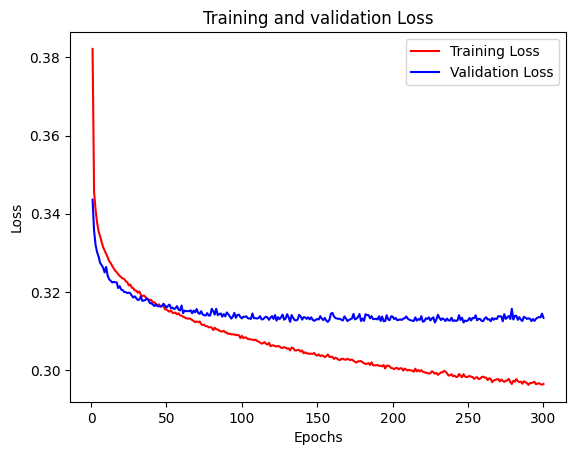

In [304]:
loss_plot(history_0)

#### Training and Validation Accuracy Plot

The code below generates a plot to visualize the accuracy of the model during training and validation phases over the epochs:
- **X-axis (Epochs)**: Represents the number of epochs (iterations) the model has trained.
  
- **Y-axis (Acc)**: Represents the accuracy of the model, indicating how well the predictions match the true labels.

- **Training Accuracy (Training Acc)**: Shows how the model’s accuracy improves on the training set.

- **Validation Accuracy (Validation Acc)**: Shows the model’s accuracy on the validation set.

In [305]:
def acc_plot(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    epochs = range(1, len(acc) + 1)
    plt.plot(epochs, acc, 'bo', label='Training Acc')
    plt.plot(epochs, val_acc, 'b', label='Validation Acc')
    plt.title('Training and validation Acc')
    plt.xlabel('Epochs')
    plt.ylabel('Acc')
    plt.legend()
    plt.show()

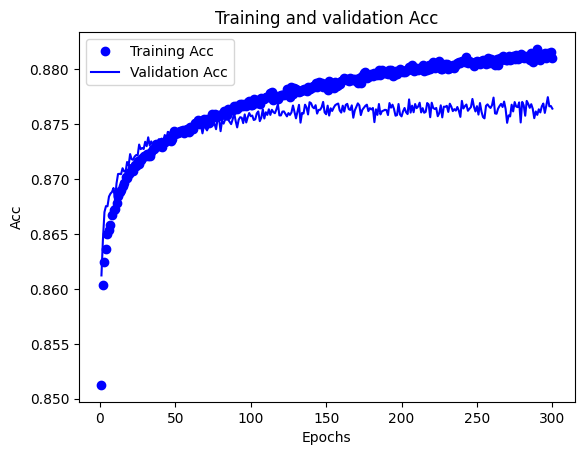

In [306]:
acc_plot(history_0)

In [307]:
x_val_std = np.reshape(VD_set_std.values, (VD_set_std.shape[0], 1, VD_set_std.shape[1]))

In [308]:
val_pred_0 = (model_0.predict(x_val_std) > 0.5).astype("int32").ravel()
print(val_pred_0)

4467/4467 ━━━━━━━━━━━━━━━━━━━━ 1s 200us/step
[0 0 0 ... 0 0 0]


In [309]:
models_std.append(model_0)
predictions_std.append(val_pred_0)

In [310]:
from sklearn.metrics import classification_report

def print_report(train_label, train_predictions, validation_label, valid_predictions, v_or_t='TEST'):
    #v_or_t to print TEST or VALIDATION RESULTS
    classes=['not top20', 'top20']
    if train_label is not None:
        print('TRAINING SET RESULTS')
        print(classification_report(train_label, train_predictions, target_names=classes))
        print('--------------------')
    print(v_or_t+' SET RESULTS')
    print(classification_report(validation_label, valid_predictions, target_names=classes))

In [311]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_std, valid_predictions=val_pred_0, v_or_t='VALIDATION')

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.89      0.97      0.93    120729
       top20       0.71      0.33      0.45     22215

    accuracy                           0.87    142944
   macro avg       0.80      0.65      0.69    142944
weighted avg       0.86      0.87      0.85    142944



In [312]:
class_names = ['Class 0', 'Class 1']

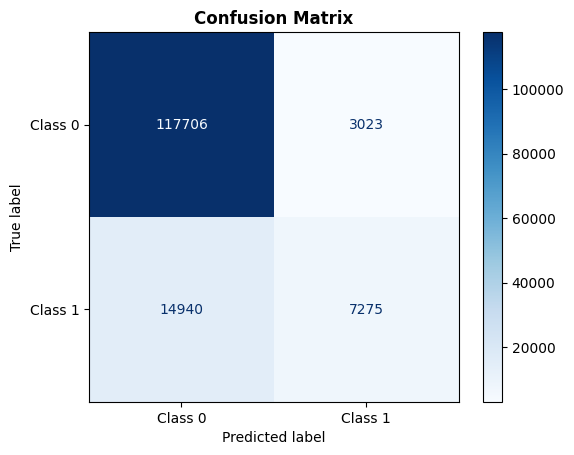

In [313]:
plot_confusion_matrix_NN(VD_label_std, val_pred_0, class_names)

Let's try the same model architecture, with same hyperparameters but without Dropout.

In [314]:
model_no_dropout = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set.shape[1])),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [315]:
history_no_dropout, model_no_dropout = fit_NN(TR_set_std, TR_label_std, 0.001, 2048, 300, model_no_dropout, es_p=None, weights=False)

Epoch 1/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8457 - loss: 0.4300 - val_accuracy: 0.8624 - val_loss: 0.3413
Epoch 2/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8612 - loss: 0.3428 - val_accuracy: 0.8656 - val_loss: 0.3347
Epoch 3/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8630 - loss: 0.3381 - val_accuracy: 0.8665 - val_loss: 0.3319
Epoch 4/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8653 - loss: 0.3336 - val_accuracy: 0.8669 - val_loss: 0.3300
Epoch 5/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8665 - loss: 0.3305 - val_accuracy: 0.8679 - val_loss: 0.3290
Epoch 6/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8675 - loss: 0.3302 - val_accuracy: 0.8684 - val_loss: 0.3269
Epoch 7/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8662 - loss: 0.3300 - val_accuracy: 0.8689 - val_loss: 0.3266
Epoch 8/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8669 - loss: 0.3295 - val_accu

In [316]:
model_no_dropout.summary()

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_15 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


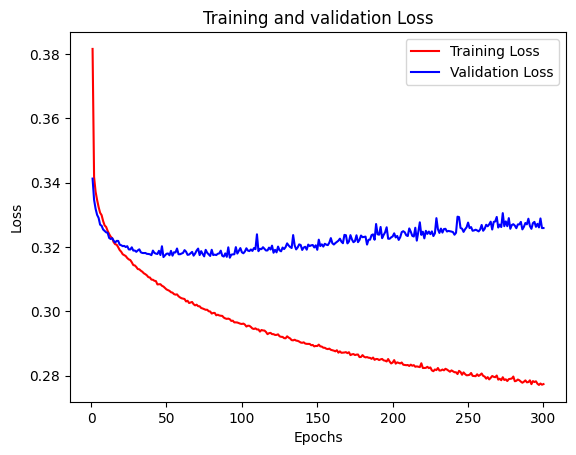

In [317]:
loss_plot(history_no_dropout)

The graph above shows that the model appears to be in *overfitting*. While the training loss decreases consistently, the validation loss starts to increase after some epochs. This suggests that the model is learning the training data too well but struggles to generalize on validation data. Therefore, reintroducing Dropout might be a suitable solution to address this issue.

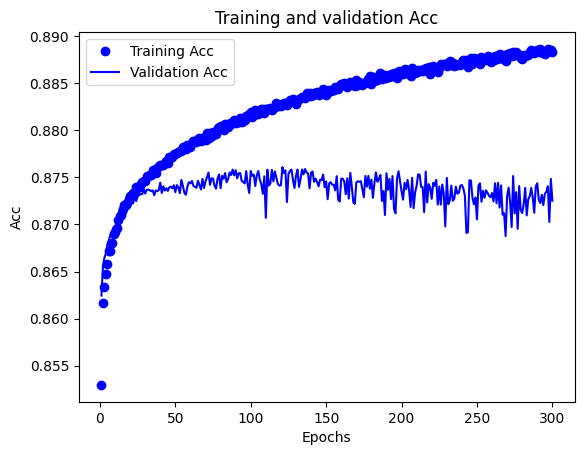

In [318]:
acc_plot(history_no_dropout)

In [319]:
val_pred_no_dropout = (model_no_dropout.predict(x_val_std) > 0.5).astype("int32").ravel()
print(val_pred_no_dropout)

4467/4467 ━━━━━━━━━━━━━━━━━━━━ 1s 198us/step
[0 0 0 ... 0 0 0]


In [320]:
models_std.append(model_no_dropout)
predictions_std.append(val_pred_no_dropout)

In [321]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_std, valid_predictions=val_pred_no_dropout, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.89      0.96      0.93    120729
       top20       0.64      0.38      0.47     22215

    accuracy                           0.87    142944
   macro avg       0.77      0.67      0.70    142944
weighted avg       0.85      0.87      0.86    142944



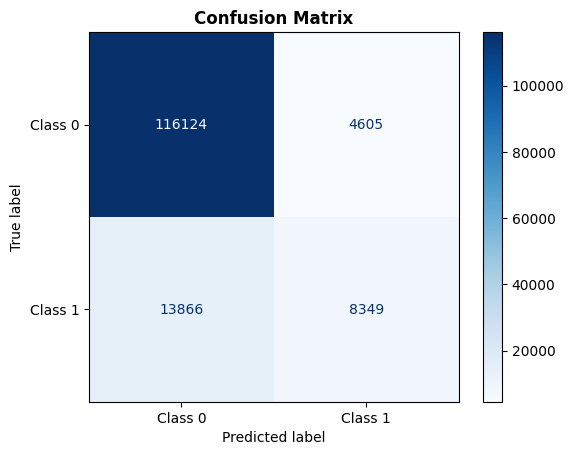

In [322]:
plot_confusion_matrix_NN(prior_labels=VD_label_std, predicted_labels= val_pred_no_dropout, class_names= class_names)

In [323]:
model_1 = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set.shape[1])),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [324]:
history_1, model_1 = fit_NN(TR_set_std, TR_label_std, 0.001, 4048, 500, model_1, es_p=None, weights=False)

Epoch 1/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8056 - loss: 0.4896 - val_accuracy: 0.8577 - val_loss: 0.3600
Epoch 2/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8557 - loss: 0.3585 - val_accuracy: 0.8612 - val_loss: 0.3423
Epoch 3/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8577 - loss: 0.3503 - val_accuracy: 0.8636 - val_loss: 0.3370
Epoch 4/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8609 - loss: 0.3430 - val_accuracy: 0.8658 - val_loss: 0.3340
Epoch 5/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8626 - loss: 0.3403 - val_accuracy: 0.8661 - val_loss: 0.3321
Epoch 6/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8636 - loss: 0.3378 - val_accuracy: 0.8665 - val_loss: 0.3307
Epoch 7/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8638 - loss: 0.3375 - val_accuracy: 0.8672 - val_loss: 0.3295
Epoch 8/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8635 - loss: 0.3374 - val_accuracy: 0.8679 - v

In [325]:
model_1.summary()

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_16 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


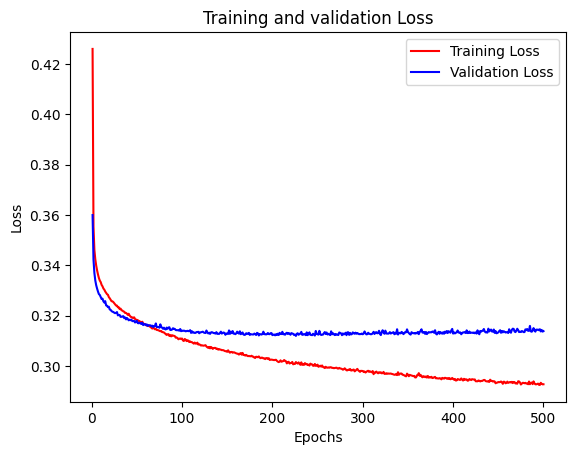

In [326]:
loss_plot(history_1)

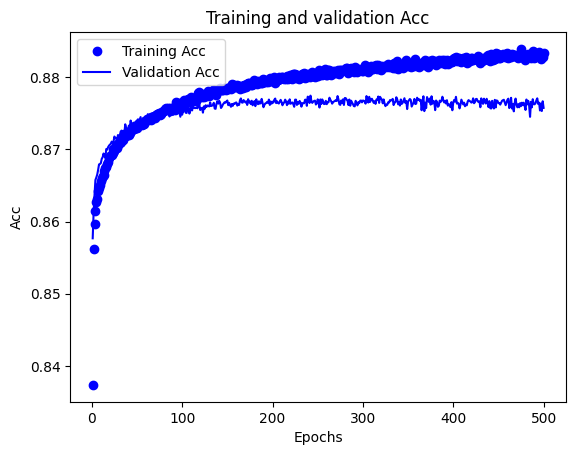

In [327]:
acc_plot(history_1)

In [328]:
val_pred_1 = (model_1.predict(x_val_std) > 0.5).astype("int32").ravel()
print(val_pred_1)

4467/4467 ━━━━━━━━━━━━━━━━━━━━ 1s 197us/step
[0 0 0 ... 0 0 0]


In [329]:
models_std.append(model_1)
predictions_std.append(val_pred_1)

In [330]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_std, valid_predictions=val_pred_1, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.89      0.97      0.93    120729
       top20       0.68      0.36      0.47     22215

    accuracy                           0.87    142944
   macro avg       0.79      0.66      0.70    142944
weighted avg       0.86      0.87      0.86    142944



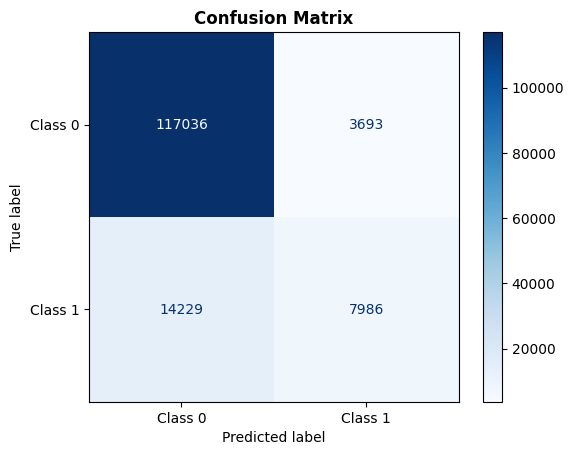

In [331]:
plot_confusion_matrix_NN(prior_labels=VD_label_std, predicted_labels= val_pred_1, class_names= class_names)

### Models trained on the unbalanced dataset assigning weights

Here we trained different models on the unbalanced dataset, without applying any over/under sampling techniques. 
But, to reduce the impact of the unbalancing, we used *class_weights = compute_class_weight()* . The *class_weights* parameter assigns higher weights to underrepresented classes, ensuring that their misclassification has a greater impact on the loss function. 

Baseline NN model

In [332]:
model_2 = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set.shape[1])),
  keras.layers.Dense(128, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [333]:
history_2, model_2 = fit_NN(TR_set_std, TR_label_std, 0.001, 2048, 300, model_2, es_p=None, weights=True)

Class weights: {0: np.float64(0.5920021299254526), 1: np.float64(3.217328394490103)}
Epoch 1/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6569 - loss: 0.5883 - val_accuracy: 0.7106 - val_loss: 0.5556
Epoch 2/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7232 - loss: 0.5352 - val_accuracy: 0.7515 - val_loss: 0.5019
Epoch 3/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7378 - loss: 0.5270 - val_accuracy: 0.7377 - val_loss: 0.5267
Epoch 4/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7382 - loss: 0.5237 - val_accuracy: 0.7273 - val_loss: 0.5385
Epoch 5/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7418 - loss: 0.5201 - val_accuracy: 0.7500 - val_loss: 0.5065
Epoch 6/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7428 - loss: 0.5205 - val_accuracy: 0.7418 - val_loss: 0.5215
Epoch 7/300
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7445 - loss: 0.5162 - val_accuracy: 0.7429 - val_loss: 0.5186
Epoch 8/300


In [334]:
model_2.summary()

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_17 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


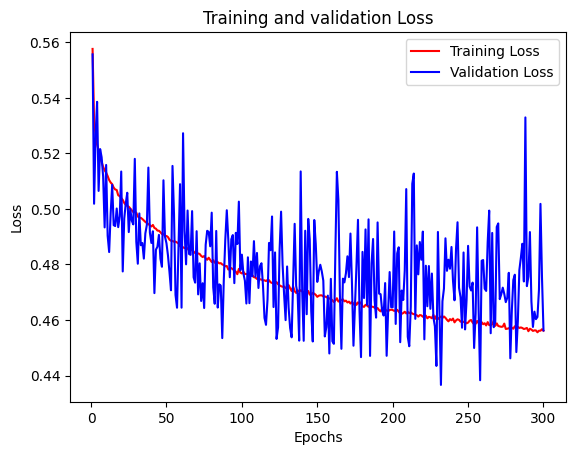

In [335]:
loss_plot(history_2)

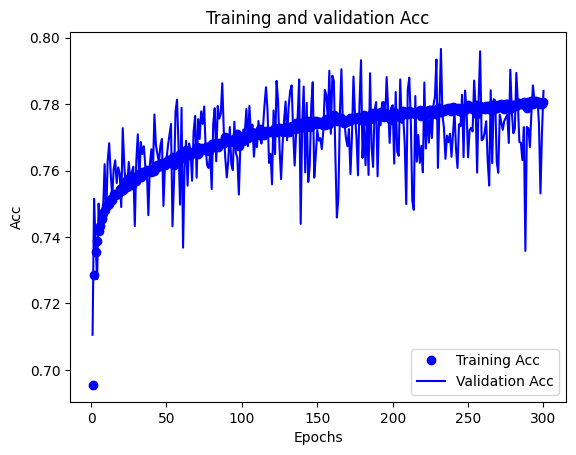

In [336]:
acc_plot(history_2)

In [337]:
val_pred_2 = (model_2.predict(x_val_std) > 0.5).astype("int32").ravel()
print(val_pred_2)

4467/4467 ━━━━━━━━━━━━━━━━━━━━ 1s 198us/step
[0 0 0 ... 0 0 1]


In [338]:
models_std.append(model_2)
predictions_std.append(val_pred_2)

In [339]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_std, valid_predictions=val_pred_2, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.94      0.80      0.86    120729
       top20       0.39      0.71      0.50     22215

    accuracy                           0.78    142944
   macro avg       0.66      0.75      0.68    142944
weighted avg       0.85      0.78      0.81    142944



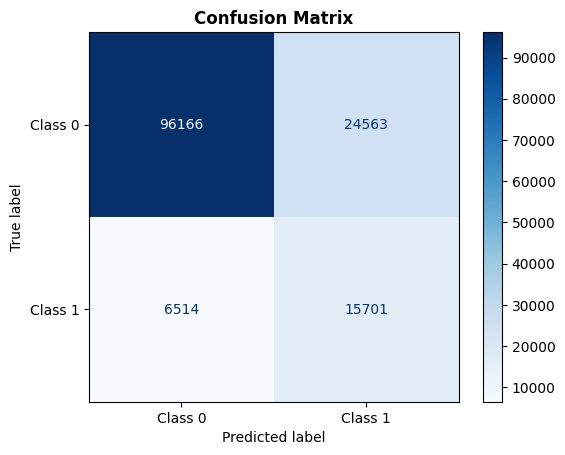

In [340]:
plot_confusion_matrix_NN(prior_labels=VD_label_std, predicted_labels= val_pred_2, class_names= class_names)

We try with the same model architecture but using larger number of epochs and larger batch size. Since the dataset is huge, we can try to incrase the batch size. This can help to reduce noise in the validation loss by providing a more accurate estimation of the gradients during training. Larger batches may reduce variance in gradient updates, leading to smoother and more stable validation loss curves. 

In [341]:
model_3 = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set.shape[1])),
  keras.layers.Dense(128, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [342]:
history_3, model_3 = fit_NN(TR_set_std, TR_label_std, 0.001, 4096, 500, model_3, es_p=None, weights=True)

Class weights: {0: np.float64(0.5920021299254526), 1: np.float64(3.217328394490103)}
Epoch 1/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6656 - loss: 0.5951 - val_accuracy: 0.7128 - val_loss: 0.5508
Epoch 2/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7194 - loss: 0.5380 - val_accuracy: 0.7407 - val_loss: 0.5183
Epoch 3/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7306 - loss: 0.5324 - val_accuracy: 0.7544 - val_loss: 0.5017
Epoch 4/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7386 - loss: 0.5252 - val_accuracy: 0.7205 - val_loss: 0.5496
Epoch 5/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7352 - loss: 0.5253 - val_accuracy: 0.7601 - val_loss: 0.4964
Epoch 6/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7396 - loss: 0.5246 - val_accuracy: 0.7475 - val_loss: 0.5145
Epoch 7/500
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7431 - loss: 0.5225 - val_accuracy: 0.7449 - val_loss: 0.5156
Epoch 8/500
66/66 ━━━━━━━━

In [343]:
model_3.summary()

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_18 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


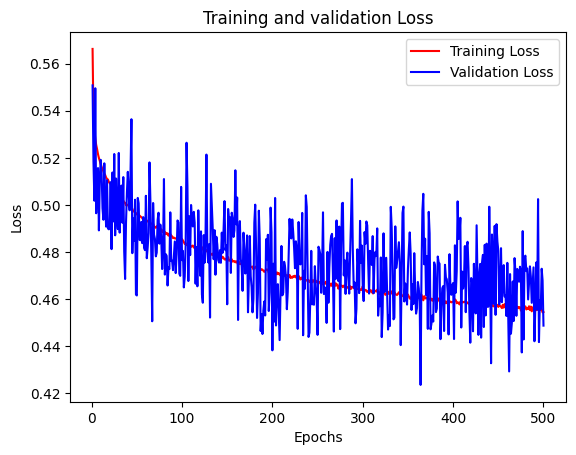

In [344]:
loss_plot(history_3)

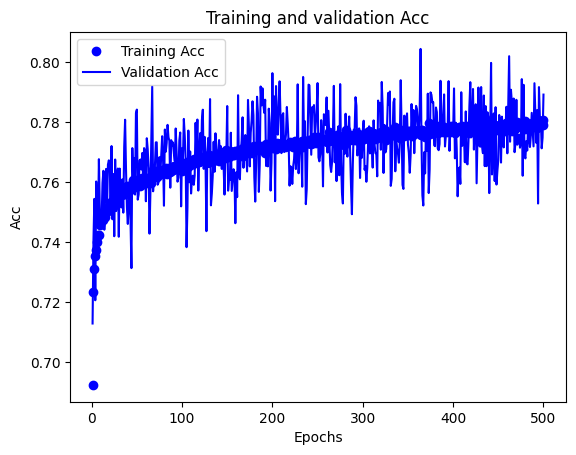

In [345]:
acc_plot(history_3)

In [346]:
val_pred_3 = (model_3.predict(x_val_std) > 0.5).astype("int32").ravel()
print(val_pred_3)

4467/4467 ━━━━━━━━━━━━━━━━━━━━ 1s 199us/step
[0 0 0 ... 0 0 1]


In [347]:
models_std.append(model_3)
predictions_std.append(val_pred_3)

In [348]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_std, valid_predictions=val_pred_3, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.93      0.81      0.87    120729
       top20       0.40      0.70      0.51     22215

    accuracy                           0.79    142944
   macro avg       0.67      0.75      0.69    142944
weighted avg       0.85      0.79      0.81    142944



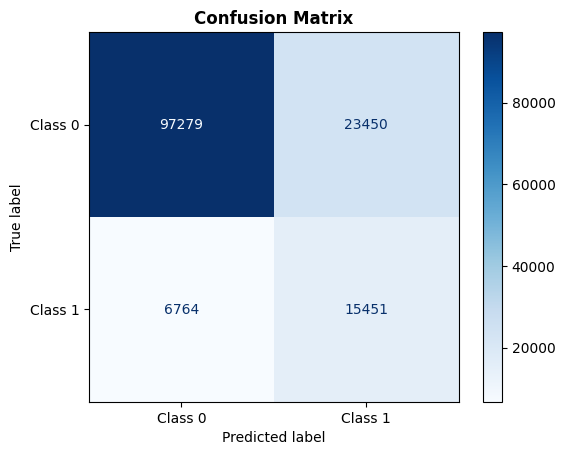

In [349]:
plot_confusion_matrix_NN(prior_labels=VD_label_std, predicted_labels= val_pred_3, class_names= class_names)

#### MODEL SELECTION: Original dataset without sampling techniques

We perform model selection based on the results obtained from the validation set, which was split from the original training set, using the macro average F1-score as the evaluation metric.

In [350]:
from sklearn.metrics import f1_score
def compare_f1_score(models:list, predictions:list, true_labels):
    macro_f1_scores = []
   
    for y_pred in predictions:
        score = f1_score(true_labels, y_pred, average='macro')
        macro_f1_scores.append(score)
        

    model_names = [model.name if hasattr(model, 'name') else f"Model {i+1}" for i, model in enumerate(models)]

    results = pd.DataFrame({'Model': model_names, 'Macro F1-Score': macro_f1_scores, 'Model Object': models})

   
    results = results.sort_values(by='Macro F1-Score', ascending=False)
    display(results[['Model', 'Macro F1-Score']])
   
    best_model = results.iloc[0]['Model Object']  
    return best_model

In [351]:
best_NN_std = compare_f1_score(models=models_std, predictions=predictions_std, true_labels=VD_label_std)

,Model,Macro F1-Score
1,sequential_15,0.700561
2,sequential_16,0.700057
0,sequential_14,0.688309
4,sequential_18,0.685604
3,sequential_17,0.681749


The model trained on the original (unbalanced) training set achieves a Macro F1-Score of "0.70" on the validation set.

In [486]:
best_NN_std.name

'sequential_15'

#### MODEL EVALUATION

In [352]:
x_test = np.reshape(test_set.values, (test_set.shape[0], 1, test_set.shape[1]))

In [353]:
test_pred_std = (best_NN_std.predict(x_test) > 0.5).astype("int32").ravel()

1019/1019 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step


In [354]:
print_report(train_label=None, train_predictions=None, validation_label=test_label, valid_predictions=test_pred_std)

TEST SET RESULTS
              precision    recall  f1-score   support

   not top20       0.88      0.95      0.92     28066
       top20       0.43      0.23      0.30      4520

    accuracy                           0.85     32586
   macro avg       0.66      0.59      0.61     32586
weighted avg       0.82      0.85      0.83     32586



1019/1019 ━━━━━━━━━━━━━━━━━━━━ 0s 210us/step
AUC-PR of the classifier: 0.3272
AUC-ROC of the classifier: 0.7331


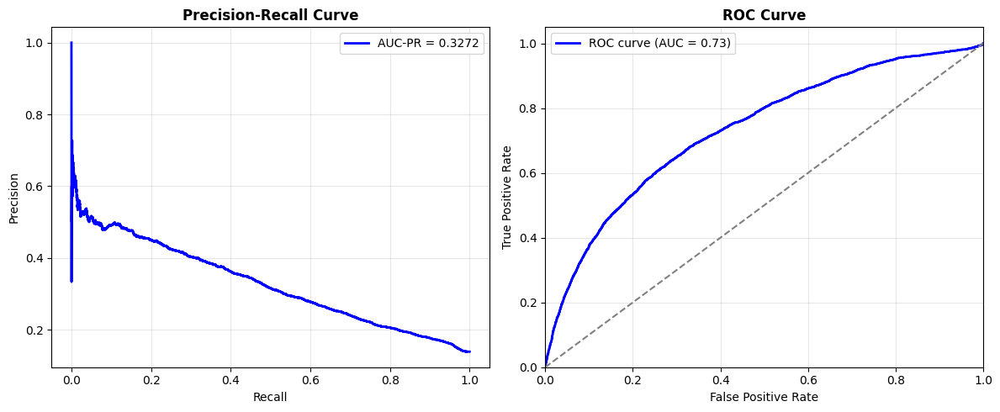

In [355]:
results_NN_std =plot_PR_ROC_AUC(best_NN_std, x_test, test_label)

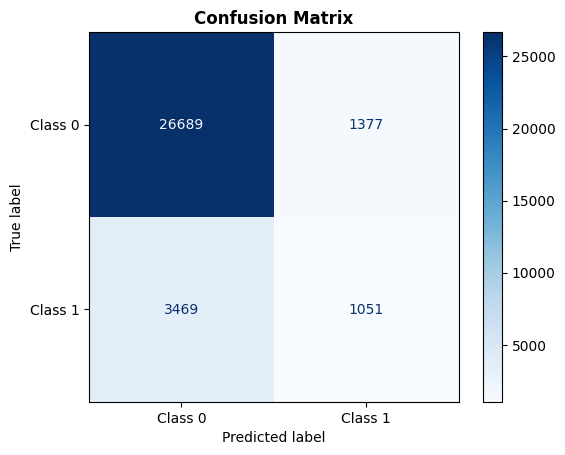

In [356]:
plot_confusion_matrix_NN(prior_labels=test_label, predicted_labels= test_pred_std, class_names= class_names)

#### Save results

In [497]:
import json
import os

def save_classification_res(method_name, params, test_pred_labels, probability_class_res):
    fpr, tpr, roc_auc, precision, recall, auc_pr = probability_class_res

    # Prepara i dati da salvare
    results = {
        "method_name": method_name,
        "params": params,
        "predicted_labels": list(map(bool, test_pred_labels)),
        "roc_curve": {
            "fpr": fpr.tolist(),  # Falsi positivi
            "tpr": tpr.tolist(),  # Veri positivi
            "roc_auc": float(roc_auc)   # Area sotto la curva ROC
        },
        "pr_curve": {
            "precision": precision.tolist(),  # Precisione
            "recall": recall.tolist(),        # Richiamo
            "auc_pr": float(auc_pr)                # Area sotto la curva Precision-Recall
        }
    }
    print(results)
    # Nome del file JSON
    filename = f"classification_results/{method_name}_res.json"

    # Salva i risultati in formato JSON
    with open(filename, 'w') as f:
        json.dump(results, f, indent=4)  # indent=4 per renderlo leggibile

    print(f"Risultati salvati in '{filename}'")



def load_classification_res(method_name):

    filename = f"classification_results/{method_name}_res.json"

    if not os.path.exists(filename):
        raise FileNotFoundError(f"Il file '{filename}' non esiste.")

    with open(filename, 'r') as f:
        results = json.load(f)

    method_name = results["method_name"]
    params = results["params"]
    predicted_labels = list(map(bool, results["predicted_labels"]))
    roc_curve = results["roc_curve"]
    pr_curve = results["pr_curve"]

    fpr = roc_curve["fpr"]
    tpr = roc_curve["tpr"]
    roc_auc = roc_curve["roc_auc"]
    precision = pr_curve["precision"]
    recall = pr_curve["recall"]
    auc_pr = pr_curve["auc_pr"]

    probability_class_res = (fpr, tpr, roc_auc, precision, recall, auc_pr)

    return method_name, params, predicted_labels, probability_class_res

Hyperparameters of the best model (sequential 15) trained on the originale training set 

In [498]:
config = {
    "Lr": 0.001,
    "Epochs": 300,
    "Batch_size": 2048,
    "Weights": False,
    "Layers_dense": 2,
    "Sorted_neurons": [128, 128],
    "Dropout": False
}

best_params_std = config

In [500]:
# save_classification_res('NN_no_sampling', best_params_std, test_pred_std, results_NN_std)

{'method_name': 'NN_no_sampling', 'params': {'Lr': 0.001, 'Epochs': 300, 'Batch_size': 2048, 'Weights': False, 'Layers_dense': 2, 'Sorted_neurons': [128, 128], 'Dropout': False}, 'predicted_labels': [True, False, True, True, False, True, True, False, False, True, True, False, True, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, True, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, True, False, False, False, False, False, False, F

### Models trained on training set oversampled with SMOTE

In [357]:
TR_set_smote.shape

(470439, 18)

Baseline NN model

In [358]:
model_0_sm  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_smote.shape[1])),
  keras.layers.Dense(128, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [359]:
history_0_sm, model_0_sm = fit_NN(TR_set_smote, TR_label_smote, 0.001, 2048, 500, model_0_sm, es_p=None, weights=False)

Epoch 1/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7071 - loss: 0.5598 - val_accuracy: 0.7494 - val_loss: 0.5058
Epoch 2/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7478 - loss: 0.5067 - val_accuracy: 0.7554 - val_loss: 0.4966
Epoch 3/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7532 - loss: 0.4987 - val_accuracy: 0.7580 - val_loss: 0.4919
Epoch 4/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7565 - loss: 0.4944 - val_accuracy: 0.7602 - val_loss: 0.4877
Epoch 5/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7579 - loss: 0.4913 - val_accuracy: 0.7623 - val_loss: 0.4857
Epoch 6/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7605 - loss: 0.4866 - val_accuracy: 0.7626 - val_loss: 0.4828
Epoch 7/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7625 - loss: 0.4840 - val_accuracy: 0.7635 - val_loss: 0.4810
Epoch 8/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7631 - loss: 0.4828 - val_accu

In [360]:
model_0_sm.summary()

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_19 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


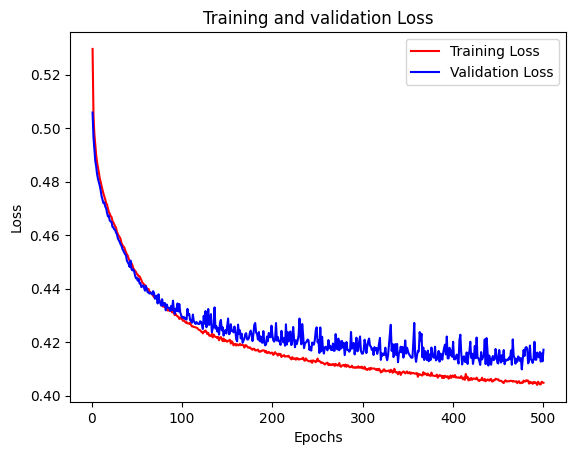

In [361]:
loss_plot(history_0_sm)

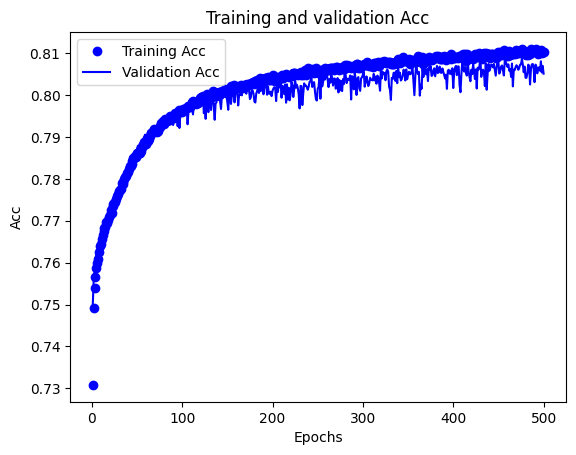

In [362]:
acc_plot(history_0_sm)

In [363]:
x_val_sm = np.reshape(VD_set_smote.values, (VD_set_smote.shape[0], 1, VD_set_smote.shape[1]))

In [364]:
val_pred_0_sm = (model_0_sm.predict(x_val_sm) > 0.5).astype("int32").ravel()
print(val_pred_0_sm)

6301/6301 ━━━━━━━━━━━━━━━━━━━━ 1s 204us/step
[0 0 1 ... 0 0 1]


In [365]:
models_sm.append(model_0_sm)
predictions_sm.append(val_pred_0_sm)

In [366]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_smote, valid_predictions=val_pred_0_sm, v_or_t="VALIDATON")

VALIDATON SET RESULTS
              precision    recall  f1-score   support

   not top20       0.84      0.83      0.84    120729
       top20       0.75      0.76      0.76     80888

    accuracy                           0.80    201617
   macro avg       0.80      0.80      0.80    201617
weighted avg       0.80      0.80      0.80    201617



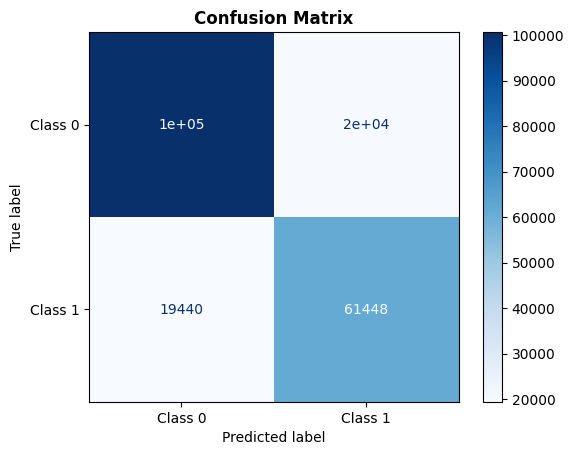

In [367]:
plot_confusion_matrix_NN(prior_labels=VD_label_smote, predicted_labels= val_pred_0_sm, class_names= class_names)

Let's try to increase the batch size

In [368]:
model_1_sm  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_smote.shape[1])),
  keras.layers.Dense(128, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [369]:
history_1_sm, model_1_sm = fit_NN(TR_set_smote, TR_label_smote, 0.001, 4096, 500, model_1_sm, es_p=None, weights=False)

Epoch 1/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6658 - loss: 0.5934 - val_accuracy: 0.7464 - val_loss: 0.5108
Epoch 2/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7443 - loss: 0.5120 - val_accuracy: 0.7508 - val_loss: 0.5040
Epoch 3/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7491 - loss: 0.5061 - val_accuracy: 0.7550 - val_loss: 0.4975
Epoch 4/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7525 - loss: 0.5003 - val_accuracy: 0.7562 - val_loss: 0.4945
Epoch 5/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7536 - loss: 0.4983 - val_accuracy: 0.7580 - val_loss: 0.4921
Epoch 6/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7569 - loss: 0.4934 - val_accuracy: 0.7592 - val_loss: 0.4895
Epoch 7/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7575 - loss: 0.4915 - val_accuracy: 0.7599 - val_loss: 0.4867
Epoch 8/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7588 - loss: 0.4895 - val_accuracy: 0.7616 - v

In [370]:
model_1_sm.summary()

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_20 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


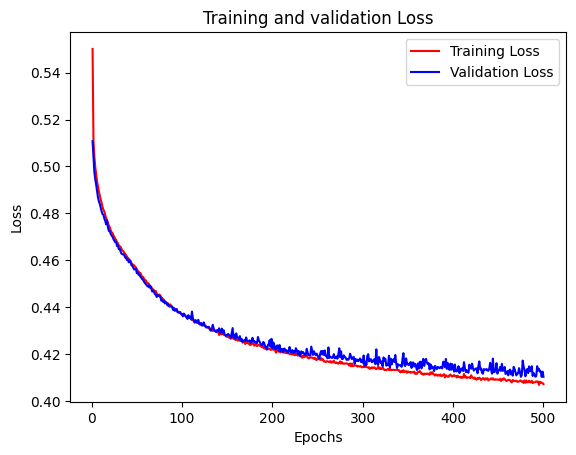

In [371]:
loss_plot(history_1_sm)

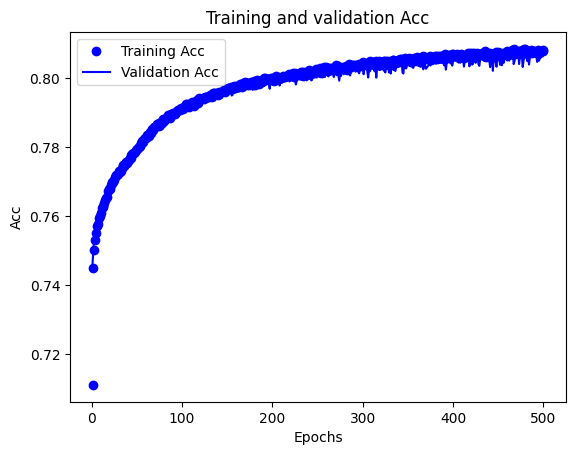

In [372]:
acc_plot(history_1_sm)

In [373]:
val_pred_1_sm = (model_1_sm.predict(x_val_sm) > 0.5).astype("int32").ravel()
print(val_pred_1_sm)

6301/6301 ━━━━━━━━━━━━━━━━━━━━ 1s 198us/step
[0 0 1 ... 0 0 1]


In [374]:
models_sm.append(model_1_sm)
predictions_sm.append(val_pred_1_sm)

In [375]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_smote, valid_predictions=val_pred_1_sm, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.83      0.85      0.84    120729
       top20       0.77      0.73      0.75     80888

    accuracy                           0.81    201617
   macro avg       0.80      0.79      0.80    201617
weighted avg       0.80      0.81      0.80    201617



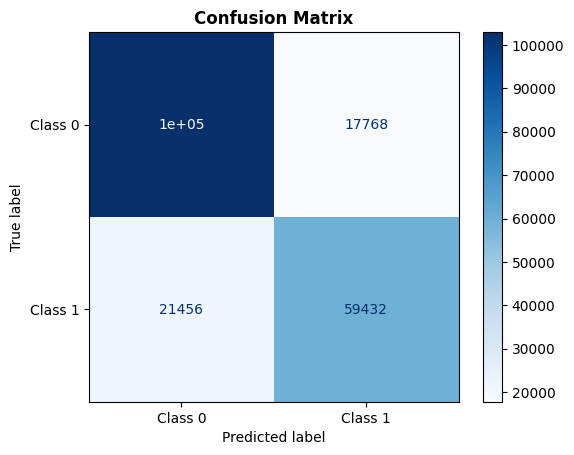

In [376]:
plot_confusion_matrix_NN(prior_labels=VD_label_smote, predicted_labels= val_pred_1_sm, class_names= class_names)

In [377]:
model_2_sm  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_smote.shape[1])),
  keras.layers.Dense(256, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(256, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [378]:
history_2_sm, model_2_sm = fit_NN(TR_set_smote, TR_label_smote, 0.001, 4096, 500, model_2_sm, es_p=None, weights=False)

Epoch 1/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6988 - loss: 0.5642 - val_accuracy: 0.7489 - val_loss: 0.5054
Epoch 2/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7478 - loss: 0.5070 - val_accuracy: 0.7557 - val_loss: 0.4969
Epoch 3/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7541 - loss: 0.4983 - val_accuracy: 0.7598 - val_loss: 0.4917
Epoch 4/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7583 - loss: 0.4924 - val_accuracy: 0.7608 - val_loss: 0.4881
Epoch 5/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7602 - loss: 0.4887 - val_accuracy: 0.7617 - val_loss: 0.4860
Epoch 6/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7607 - loss: 0.4882 - val_accuracy: 0.7639 - val_loss: 0.4827
Epoch 7/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7640 - loss: 0.4829 - val_accuracy: 0.7648 - val_loss: 0.4801
Epoch 8/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7642 - loss: 0.4813 - val_accuracy: 0.7652 - v

In [379]:
model_2_sm.summary()

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_21 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 212,741 (831.02 KB)

 Trainable params: 70,913 (277.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 141,828 (554.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


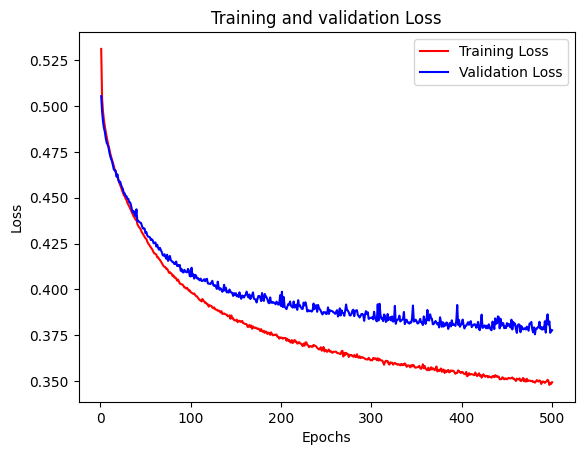

In [380]:
loss_plot(history_2_sm)

As we can see here, the validation loss increases rather than decreases, indicating that the model is likely starting to overfit. Therefore, adding Dropout may be necessary to improve generalization.

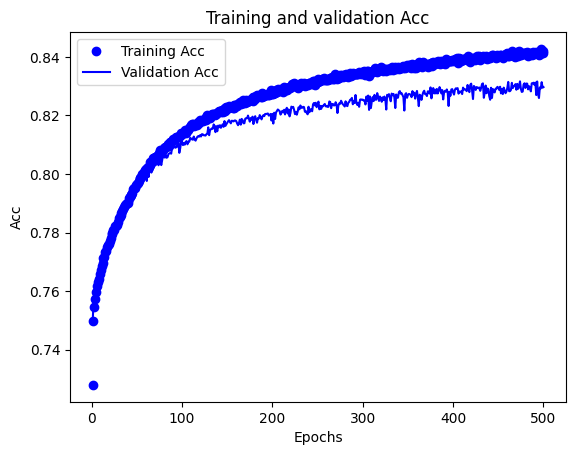

In [381]:
acc_plot(history_2_sm)

In [382]:
val_pred_2_sm = (model_2_sm.predict(x_val_sm) > 0.5).astype("int32").ravel()
print(val_pred_2_sm)

6301/6301 ━━━━━━━━━━━━━━━━━━━━ 2s 239us/step
[0 1 1 ... 0 0 1]


In [383]:
models_sm.append(model_2_sm)
predictions_sm.append(val_pred_2_sm)

In [384]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_smote, valid_predictions=val_pred_2_sm, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.84      0.87      0.86    120729
       top20       0.80      0.76      0.78     80888

    accuracy                           0.83    201617
   macro avg       0.82      0.82      0.82    201617
weighted avg       0.83      0.83      0.83    201617



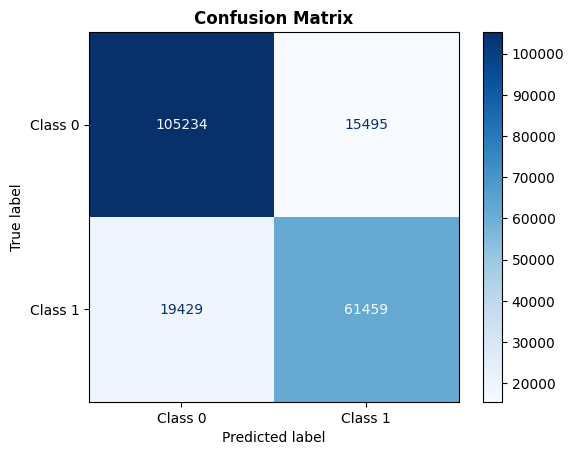

In [385]:
plot_confusion_matrix_NN(prior_labels=VD_label_smote, predicted_labels= val_pred_2_sm, class_names= class_names)

In [386]:
model_3_sm  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_smote.shape[1])),
  keras.layers.Dense(256, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(512, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(256, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [387]:
history_3_sm, model_3_sm = fit_NN(TR_set_smote, TR_label_smote, 0.001, 4096, 500, model_3_sm, es_p=None, weights=False)

Epoch 1/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.6977 - loss: 0.5563 - val_accuracy: 0.7544 - val_loss: 0.4981
Epoch 2/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7533 - loss: 0.4979 - val_accuracy: 0.7599 - val_loss: 0.4882
Epoch 3/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7574 - loss: 0.4906 - val_accuracy: 0.7629 - val_loss: 0.4818
Epoch 4/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.7632 - loss: 0.4840 - val_accuracy: 0.7662 - val_loss: 0.4777
Epoch 5/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7647 - loss: 0.4797 - val_accuracy: 0.7668 - val_loss: 0.4764
Epoch 6/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.7684 - loss: 0.4752 - val_accuracy: 0.7701 - val_loss: 0.4700
Epoch 7/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.7700 - loss: 0.4707 - val_accuracy: 0.7717 - val_loss: 0.4686
Epoch 8/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.7729 - loss: 0.4678 - val_accuracy: 0.

In [388]:
model_3_sm.summary()

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_22 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 804,101 (3.07 MB)

 Trainable params: 268,033 (1.02 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 536,068 (2.04 MB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


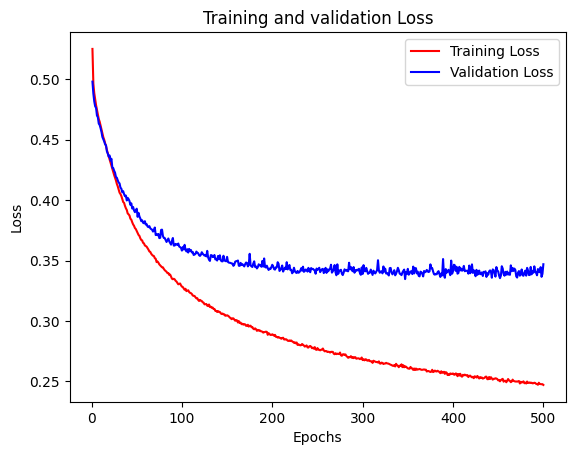

In [389]:
loss_plot(history_3_sm)

As we can see here, the validation loss increases rather than decreases, indicating that the model is likely starting to overfit. Therefore, adding Dropout may be necessary to improve generalization.

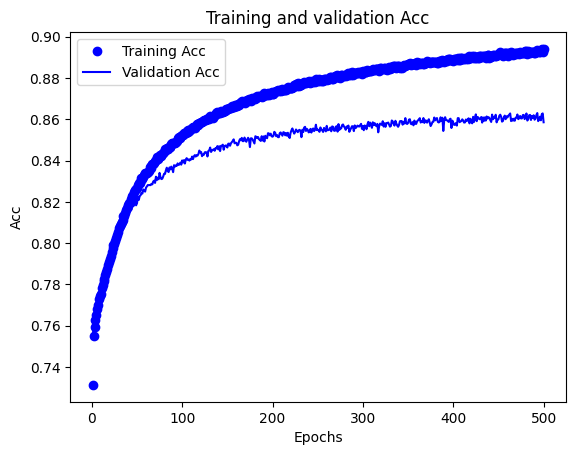

In [390]:
acc_plot(history_3_sm)

In [391]:
val_pred_3_sm = (model_3_sm.predict(x_val_sm) > 0.5).astype("int32").ravel()
print(val_pred_3_sm)

6301/6301 ━━━━━━━━━━━━━━━━━━━━ 2s 357us/step
[1 1 1 ... 0 0 1]


In [392]:
models_sm.append(model_3_sm)
predictions_sm.append(val_pred_3_sm)

In [393]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_smote, valid_predictions=val_pred_3_sm, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.91      0.85      0.88    120729
       top20       0.79      0.88      0.83     80888

    accuracy                           0.86    201617
   macro avg       0.85      0.86      0.86    201617
weighted avg       0.86      0.86      0.86    201617



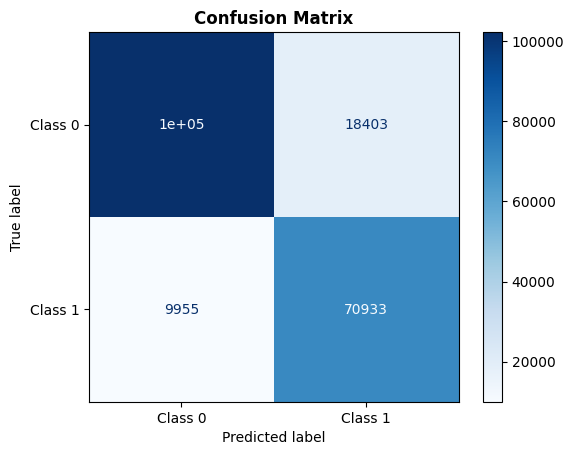

In [394]:
plot_confusion_matrix_NN(prior_labels=VD_label_smote, predicted_labels= val_pred_3_sm, class_names= class_names)

#### MODEL SELECTION: Dataset oversampled with SMOTE technique

In [395]:
best_NN_sm = compare_f1_score(models=models_sm, predictions=predictions_sm, true_labels=VD_label_smote)

,Model,Macro F1-Score
3,sequential_22,0.855852
2,sequential_21,0.818211
0,sequential_19,0.796516
1,sequential_20,0.795941


The model trained on the oversampled training set using SMOTE achieves a Macro F1-Score of "0.86" on the validation set.

In [485]:
best_NN_sm.name

'sequential_22'

#### MODEL EVALUATION

In [396]:
test_pred_sm = (best_NN_sm.predict(x_test) > 0.5).astype("int32").ravel()

1019/1019 ━━━━━━━━━━━━━━━━━━━━ 0s 448us/step


In [397]:
print_report(train_label=None, train_predictions=None, validation_label=test_label, valid_predictions=test_pred_sm)

TEST SET RESULTS
              precision    recall  f1-score   support

   not top20       0.90      0.89      0.89     28066
       top20       0.34      0.36      0.35      4520

    accuracy                           0.82     32586
   macro avg       0.62      0.62      0.62     32586
weighted avg       0.82      0.82      0.82     32586



1019/1019 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step
AUC-PR of the classifier: 0.3055
AUC-ROC of the classifier: 0.7168


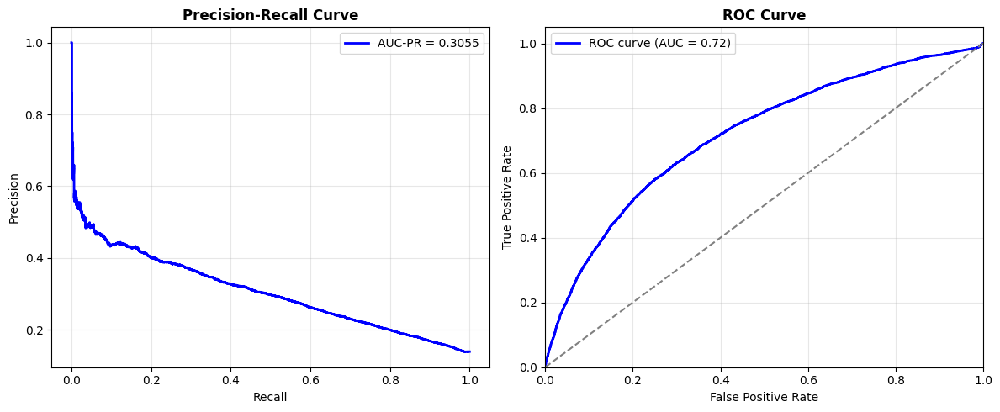

In [398]:
results_NN_sm = plot_PR_ROC_AUC(best_NN_sm, x_test, test_label)

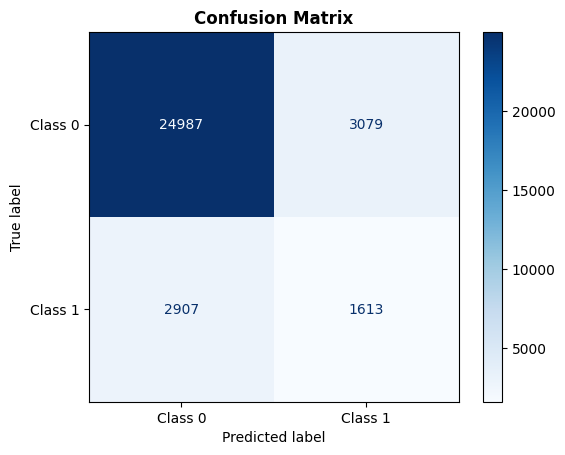

In [399]:
plot_confusion_matrix_NN(prior_labels=test_label, predicted_labels= test_pred_sm, class_names= class_names)

#### Save results

In [503]:
config = {
    "Lr": 0.001,
    "Epochs": 500,
    "Batch_size": 4096,
    "Weights": False,
    "Layers_dense": 3, # output Dense layers is not counted
    "Sorted_neurons": [256, 512, 256],
    "Dropout": True  # we assume a Dropout (0.1) layer between each pair of internal Dense layers
}

best_params_sm = config

In [504]:
# save_classification_res('NN_SMOTE', best_params_sm, test_pred_sm, results_NN_sm)

{'method_name': 'NN_SMOTE', 'params': {'Lr': 0.001, 'Epochs': 500, 'Batch_size': 4096, 'Weights': False, 'Layers_dense': 3, 'Sorted_neurons': [256, 512, 256], 'Dropout': True}, 'predicted_labels': [True, False, True, True, False, True, True, False, True, False, True, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, True, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, Fals

### Models trained on training set oversampled with Randomsampling

In [400]:
TR_set_os.shape

,cyclist_age,race_year,points,length,climb_total,startlist_quality,BMI,AVG position_2021,# cyclist races_2021,std_dev position_2021,geo area_Africa,geo area_America,geo area_Asia,geo area_Eastern Europe,geo area_Northern Europe,geo area_Oceania,geo area_Southern Europe,geo area_Western Europe
249720,-1.141184,-1.052279,0.185748,0.344218,0.024214,1.834289,0.367494,0.041988,1.428647,-0.366002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
359100,0.501308,0.967935,-0.723115,-2.149653,-1.423156,-0.629930,-0.479912,0.524836,1.456313,0.438399,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
383229,1.596303,1.136286,-0.723115,-0.055670,0.555652,-0.466342,-0.953238,0.393150,1.193481,-0.533111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
296127,-0.593687,0.547057,0.185748,-1.763715,-1.550305,1.572027,0.688134,0.744312,-0.169094,1.688440,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
637663,2.691298,0.462882,-0.723115,0.572061,-0.300131,-0.326123,0.199540,-1.362660,1.573896,-0.284980,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631441,-0.046189,-1.557332,2.457905,1.157942,1.103841,-1.582900,0.138466,-1.450450,0.626318,0.440235,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
655222,0.227559,-0.547225,-0.723115,0.003229,0.495504,-0.513081,-1.185987,-1.055393,0.487986,-0.420126,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
376078,-0.867436,0.378706,-0.723115,-0.767097,-0.367893,-0.975285,-0.434106,0.875998,0.155987,0.056062,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
31702,0.501308,-0.799752,-0.177798,0.537962,1.377174,-0.165130,1.062553,-0.792022,-0.902256,0.070589,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Baseline NN model

In [401]:
model_0_os  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_os.shape[1])),
  keras.layers.Dense(128, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [402]:
history_0_os, model_0_os = fit_NN(TR_set_os, TR_label_os, 0.001, 2048, 500, model_0_os, es_p=None, weights=False)

Epoch 1/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7140 - loss: 0.5548 - val_accuracy: 0.7471 - val_loss: 0.5103
Epoch 2/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7443 - loss: 0.5137 - val_accuracy: 0.7517 - val_loss: 0.5041
Epoch 3/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7505 - loss: 0.5060 - val_accuracy: 0.7538 - val_loss: 0.5001
Epoch 4/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7521 - loss: 0.5026 - val_accuracy: 0.7556 - val_loss: 0.4973
Epoch 5/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7536 - loss: 0.4998 - val_accuracy: 0.7568 - val_loss: 0.4957
Epoch 6/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7555 - loss: 0.4979 - val_accuracy: 0.7567 - val_loss: 0.4936
Epoch 7/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7574 - loss: 0.4955 - val_accuracy: 0.7574 - val_loss: 0.4928
Epoch 8/500
184/184 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7588 - loss: 0.4918 - val_accu

In [403]:
model_0_os.summary()

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_23 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


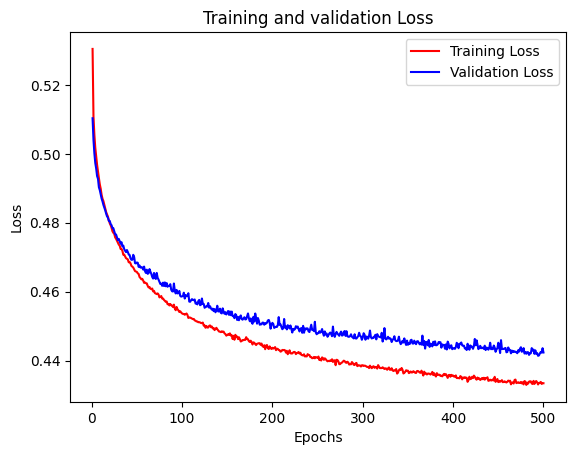

In [404]:
loss_plot(history_0_os)

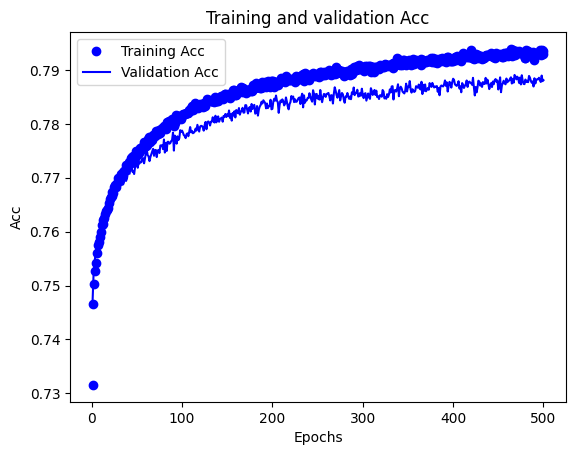

In [405]:
acc_plot(history_0_os)

In [406]:
x_val_os = np.reshape(VD_set_os.values, (VD_set_os.shape[0], 1, VD_set_os.shape[1]))

In [407]:
val_pred_0_os = (model_0_os.predict(x_val_os) > 0.5).astype("int32").ravel()
print(val_pred_0_os)

6301/6301 ━━━━━━━━━━━━━━━━━━━━ 1s 200us/step
[0 0 0 ... 0 0 1]


In [408]:
models_os.append(model_0_os)
predictions_os.append(val_pred_0_os)

In [409]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_os, valid_predictions=val_pred_0_os, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.80      0.86      0.83    120729
       top20       0.76      0.69      0.72     80888

    accuracy                           0.79    201617
   macro avg       0.78      0.77      0.78    201617
weighted avg       0.79      0.79      0.79    201617



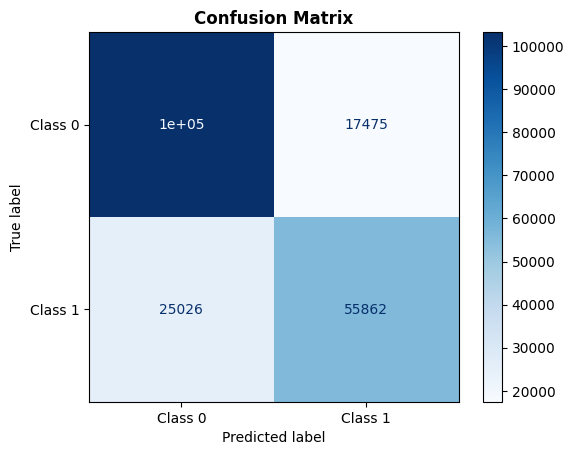

In [410]:
plot_confusion_matrix_NN(prior_labels=VD_label_os, predicted_labels= val_pred_0_os, class_names= class_names)

In [411]:
model_1_os  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_os.shape[1])),
  keras.layers.Dense(256, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(256, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [412]:
history_1_os, model_1_os = fit_NN(TR_set_os, TR_label_os, 0.001, 4096, 500, model_1_os, es_p=None, weights=False)

Epoch 1/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7103 - loss: 0.5596 - val_accuracy: 0.7475 - val_loss: 0.5107
Epoch 2/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7460 - loss: 0.5117 - val_accuracy: 0.7527 - val_loss: 0.5047
Epoch 3/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7497 - loss: 0.5056 - val_accuracy: 0.7530 - val_loss: 0.5029
Epoch 4/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7531 - loss: 0.5015 - val_accuracy: 0.7568 - val_loss: 0.4965
Epoch 5/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7574 - loss: 0.4955 - val_accuracy: 0.7582 - val_loss: 0.4948
Epoch 6/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7585 - loss: 0.4936 - val_accuracy: 0.7594 - val_loss: 0.4921
Epoch 7/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7589 - loss: 0.4923 - val_accuracy: 0.7612 - val_loss: 0.4900
Epoch 8/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7596 - loss: 0.4904 - val_accuracy: 0.7610 - v

In [413]:
model_1_os.summary()

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_24 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 212,741 (831.02 KB)

 Trainable params: 70,913 (277.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 141,828 (554.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


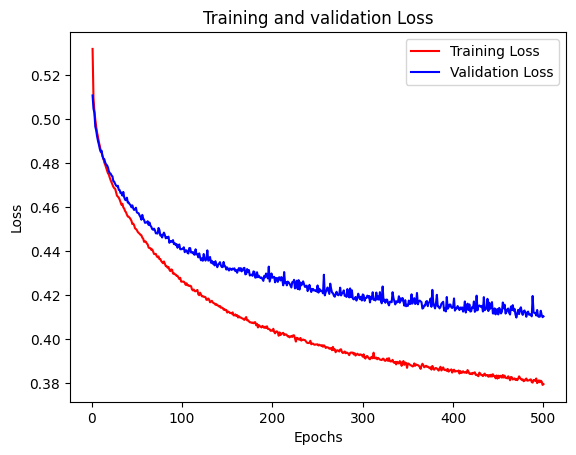

In [414]:
loss_plot(history_1_os)

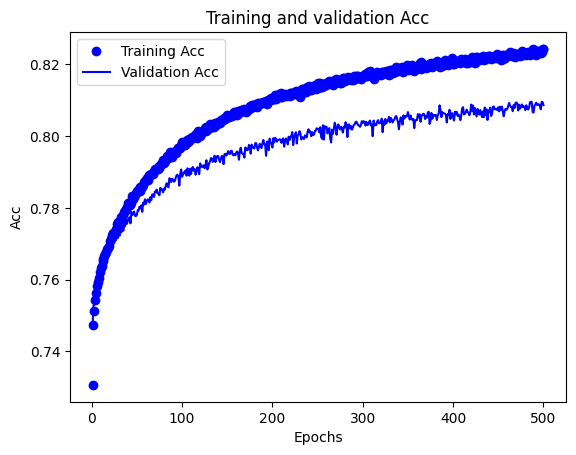

In [415]:
acc_plot(history_1_os)

In [416]:
val_pred_1_os = (model_1_os.predict(x_val_os) > 0.5).astype("int32").ravel()
print(val_pred_1_os)

6301/6301 ━━━━━━━━━━━━━━━━━━━━ 2s 238us/step
[0 0 0 ... 0 0 1]


In [417]:
models_os.append(model_1_os)
predictions_os.append(val_pred_1_os)

In [418]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_os, valid_predictions=val_pred_1_os, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.84      0.85      0.84    120729
       top20       0.77      0.75      0.76     80888

    accuracy                           0.81    201617
   macro avg       0.80      0.80      0.80    201617
weighted avg       0.81      0.81      0.81    201617



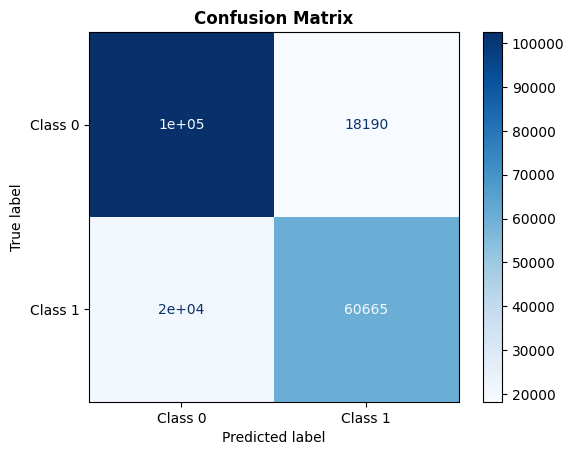

In [419]:
plot_confusion_matrix_NN(prior_labels=VD_label_os, predicted_labels= val_pred_1_os, class_names= class_names)

In [420]:
model_2_os  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_os.shape[1])),
  keras.layers.Dense(256, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(512, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(256, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [421]:
history_2_os, model_2_os = fit_NN(TR_set_os, TR_label_os, 0.001, 4096, 300, model_2_os, es_p=None, weights=False)

Epoch 1/300
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.7131 - loss: 0.5518 - val_accuracy: 0.7521 - val_loss: 0.5039
Epoch 2/300
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7490 - loss: 0.5074 - val_accuracy: 0.7555 - val_loss: 0.4984
Epoch 3/300
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7536 - loss: 0.5010 - val_accuracy: 0.7582 - val_loss: 0.4936
Epoch 4/300
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7579 - loss: 0.4936 - val_accuracy: 0.7598 - val_loss: 0.4893
Epoch 5/300
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7584 - loss: 0.4915 - val_accuracy: 0.7613 - val_loss: 0.4873
Epoch 6/300
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7620 - loss: 0.4875 - val_accuracy: 0.7629 - val_loss: 0.4832
Epoch 7/300
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.7631 - loss: 0.4847 - val_accuracy: 0.7644 - val_loss: 0.4818
Epoch 8/300
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.7645 - loss: 0.4825 - val_accuracy: 0.

In [422]:
model_2_os.summary()

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_25 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_84 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 804,101 (3.07 MB)

 Trainable params: 268,033 (1.02 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 536,068 (2.04 MB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


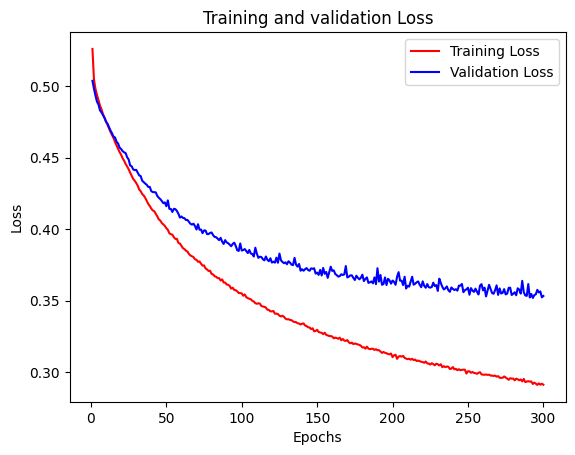

In [423]:
loss_plot(history_2_os)

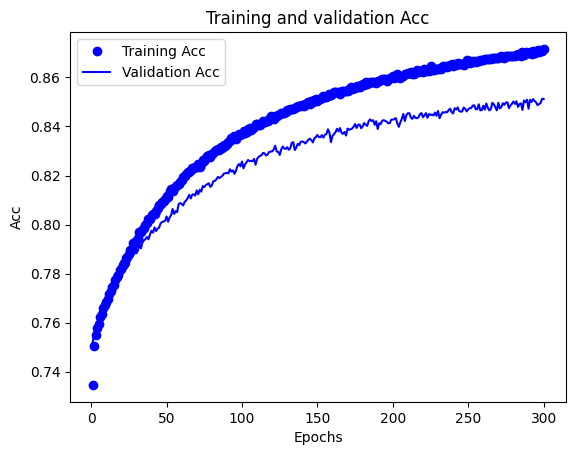

In [424]:
acc_plot(history_2_os)

In [425]:
val_pred_2_os = (model_2_os.predict(x_val_os) > 0.5).astype("int32").ravel()
print(val_pred_2_os)

6301/6301 ━━━━━━━━━━━━━━━━━━━━ 2s 359us/step
[0 1 1 ... 0 0 1]


In [426]:
models_os.append(model_2_os)
predictions_os.append(val_pred_2_os)

In [427]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_os, valid_predictions=val_pred_2_os, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.90      0.85      0.87    120729
       top20       0.79      0.86      0.82     80888

    accuracy                           0.85    201617
   macro avg       0.84      0.85      0.85    201617
weighted avg       0.86      0.85      0.85    201617



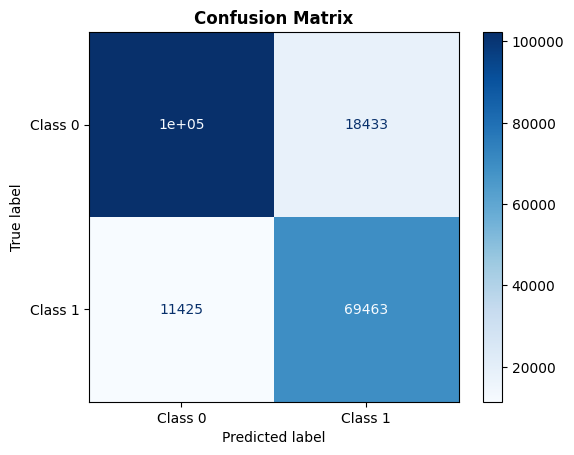

In [428]:
plot_confusion_matrix_NN(prior_labels=VD_label_os, predicted_labels= val_pred_2_os, class_names= class_names)

In [429]:
model_3_os  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_os.shape[1])),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(256, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(512, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(256, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [430]:
history_3_os, model_3_os = fit_NN(TR_set_os, TR_label_os, 0.001, 4096, 500, model_3_os, es_p=None, weights=False)

Epoch 1/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.6866 - loss: 0.5738 - val_accuracy: 0.7481 - val_loss: 0.5085
Epoch 2/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.7446 - loss: 0.5126 - val_accuracy: 0.7547 - val_loss: 0.4998
Epoch 3/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.7503 - loss: 0.5046 - val_accuracy: 0.7578 - val_loss: 0.4947
Epoch 4/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.7537 - loss: 0.5000 - val_accuracy: 0.7597 - val_loss: 0.4906
Epoch 5/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.7566 - loss: 0.4955 - val_accuracy: 0.7619 - val_loss: 0.4885
Epoch 6/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.7594 - loss: 0.4910 - val_accuracy: 0.7630 - val_loss: 0.4864
Epoch 7/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.7604 - loss: 0.4898 - val_accuracy: 0.7622 - val_loss: 0.4852
Epoch 8/500
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.7632 - loss: 0.4857 - val_accuracy: 0.

In [431]:
model_3_os.summary()

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_26 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 994,181 (3.79 MB)

 Trainable params: 331,393 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 662,788 (2.53 MB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


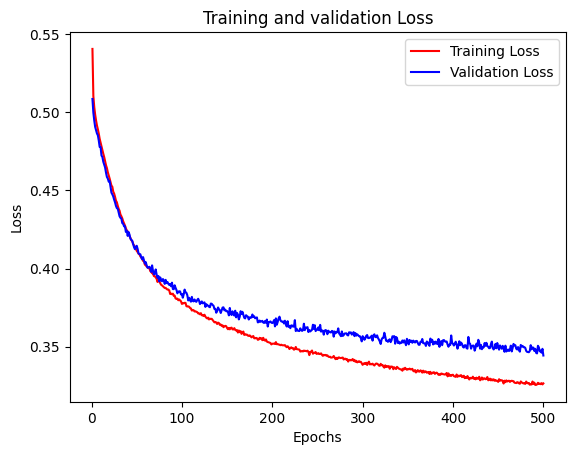

In [432]:
loss_plot(history_3_os)

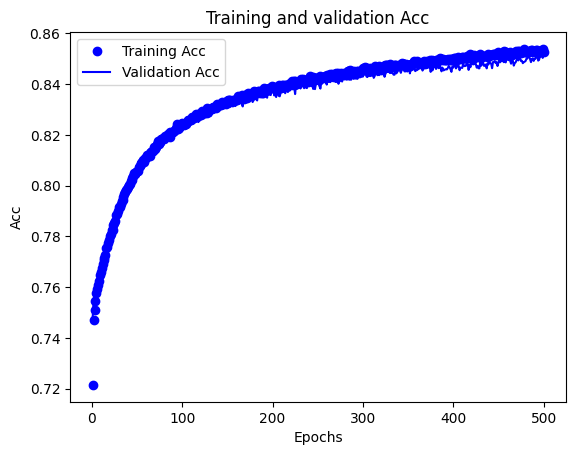

In [433]:
acc_plot(history_3_os)

In [434]:
val_pred_3_os = (model_3_os.predict(x_val_os) > 0.5).astype("int32").ravel()
print(val_pred_3_os)

6301/6301 ━━━━━━━━━━━━━━━━━━━━ 3s 409us/step
[1 1 1 ... 0 0 1]


In [435]:
models_os.append(model_3_os)
predictions_os.append(val_pred_3_os)

In [436]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_os, valid_predictions=val_pred_3_os, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.91      0.84      0.87    120729
       top20       0.78      0.88      0.83     80888

    accuracy                           0.85    201617
   macro avg       0.85      0.86      0.85    201617
weighted avg       0.86      0.85      0.85    201617



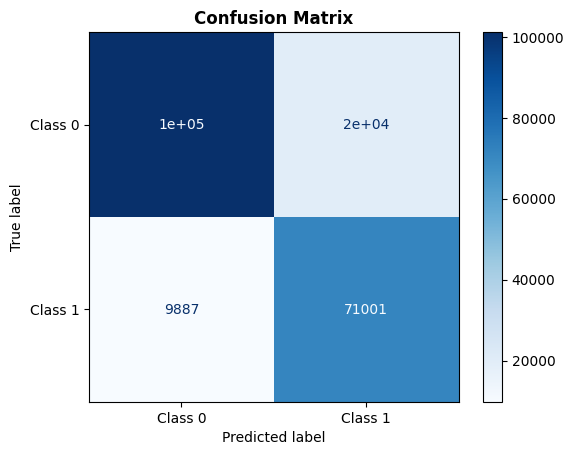

In [437]:
plot_confusion_matrix_NN(prior_labels=VD_label_os, predicted_labels= val_pred_3_os, class_names= class_names)

#### MODEL SELECTION: Dataset oversampled with Random Sampling technique

In [438]:
best_NN_os = compare_f1_score(models=models_os, predictions=predictions_os, true_labels=VD_label_os)

,Model,Macro F1-Score
3,sequential_26,0.850543
2,sequential_25,0.847873
1,sequential_24,0.800887
0,sequential_23,0.776871


The model trained on the oversampled training set using Random Sampling achieves a Macro F1-Score of "0.85" on the validation set.

In [484]:
best_NN_os.name

'sequential_26'

#### MODEL EVALUATION

In [439]:
test_pred_os = (best_NN_os.predict(x_test) > 0.5).astype("int32").ravel()

1019/1019 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step


In [440]:
print_report(train_label=None, train_predictions=None, validation_label=test_label, valid_predictions=test_pred_os)

TEST SET RESULTS
              precision    recall  f1-score   support

   not top20       0.91      0.85      0.88     28066
       top20       0.33      0.47      0.39      4520

    accuracy                           0.79     32586
   macro avg       0.62      0.66      0.63     32586
weighted avg       0.83      0.79      0.81     32586



1019/1019 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step
AUC-PR of the classifier: 0.3344
AUC-ROC of the classifier: 0.7305


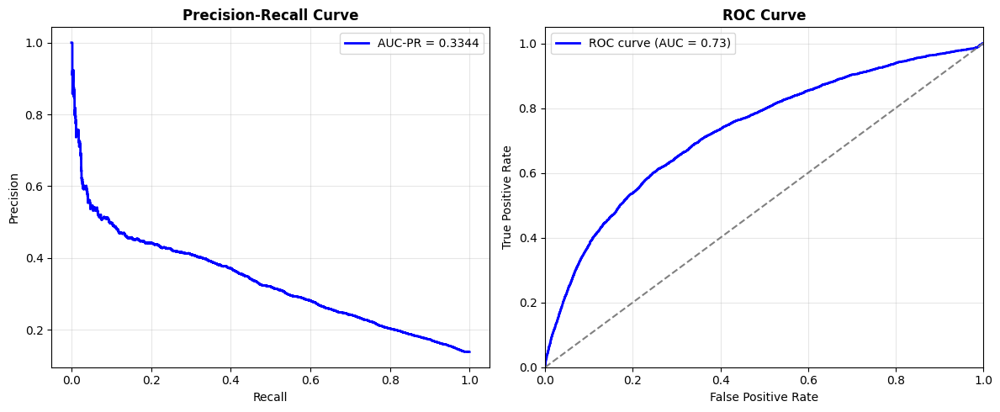

In [441]:
results_NN_os = plot_PR_ROC_AUC(best_NN_os, x_test, test_label)

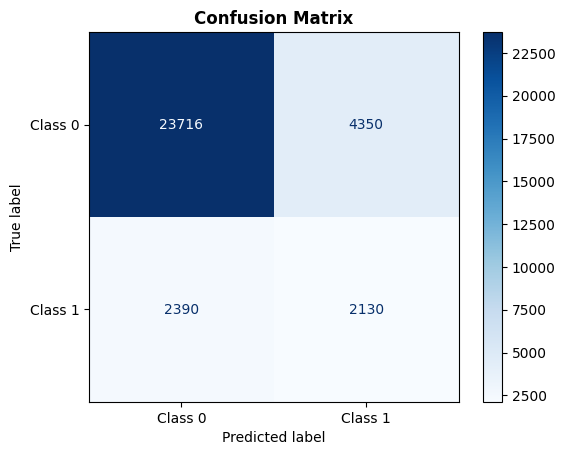

In [442]:
plot_confusion_matrix_NN(prior_labels=test_label, predicted_labels= test_pred_os, class_names= class_names)

#### Save results

In [506]:
config = {
    "Lr": 0.001,
    "Epochs": 500,
    "Batch_size": 4096,
    "Weights": False,
    "Layers_dense": 5,
    "Sorted_neurons": [128, 256, 512, 256, 128],
    "Dropout": True
}

best_params_os = config

In [507]:
# save_classification_res('NN_over_sampling', best_params_os, test_pred_os, results_NN_os)

{'method_name': 'NN_over_sampling', 'params': {'Lr': 0.001, 'Epochs': 500, 'Batch_size': 4096, 'Weights': False, 'Layers_dense': 5, 'Sorted_neurons': [128, 256, 512, 256, 128], 'Dropout': True}, 'predicted_labels': [True, False, True, True, False, False, True, True, True, True, False, False, True, True, True, True, False, True, True, True, True, False, False, False, False, False, True, True, False, True, False, False, True, False, True, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, True, False, False, False, False, Fals

### Models trained on training set undersampled with Randomsampling

In [495]:
TR_set_us.shape

(129198, 18)

Baseline NN model

In [444]:
model_0_us  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_us.shape[1])),
  keras.layers.Dense(128, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [445]:
history_0_us, model_0_us = fit_NN(TR_set_us, TR_label_us, 0.001, 2048, 500, model_0_us, es_p=None, weights=False)

Epoch 1/500
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6497 - loss: 0.6131 - val_accuracy: 0.7339 - val_loss: 0.5279
Epoch 2/500
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7326 - loss: 0.5287 - val_accuracy: 0.7400 - val_loss: 0.5190
Epoch 3/500
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7429 - loss: 0.5163 - val_accuracy: 0.7425 - val_loss: 0.5152
Epoch 4/500
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7434 - loss: 0.5162 - val_accuracy: 0.7452 - val_loss: 0.5130
Epoch 5/500
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7454 - loss: 0.5131 - val_accuracy: 0.7459 - val_loss: 0.5116
Epoch 6/500
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7455 - loss: 0.5115 - val_accuracy: 0.7481 - val_loss: 0.5091
Epoch 7/500
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7478 - loss: 0.5087 - val_accuracy: 0.7487 - val_loss: 0.5076
Epoch 8/500
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7497 - loss: 0.5077 - val_accuracy: 0.7502 - v

In [446]:
model_0_us.summary()

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_27 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,221 (223.52 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,148 (149.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


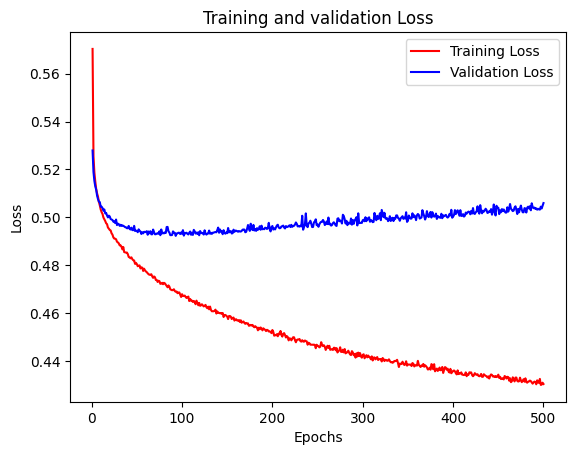

In [447]:
loss_plot(history_0_us)

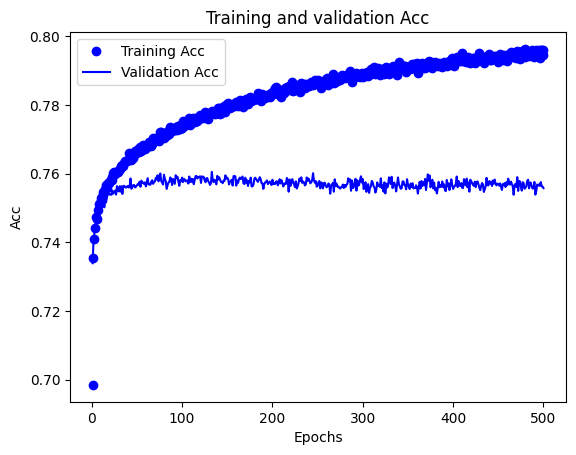

In [448]:
acc_plot(history_0_us)

In [449]:
x_val_us = np.reshape(VD_set_us.values, (VD_set_us.shape[0], 1, VD_set_us.shape[1]))

In [450]:
val_pred_0_us = (model_0_us.predict(x_val_us) > 0.5).astype("int32").ravel()
print(val_pred_0_us)

1731/1731 ━━━━━━━━━━━━━━━━━━━━ 0s 211us/step
[0 0 1 ... 0 0 0]


In [451]:
models_us.append(model_0_us)
predictions_us.append(val_pred_0_us)

In [452]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_us, valid_predictions=val_pred_0_us, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.77      0.86      0.81     33156
       top20       0.74      0.61      0.67     22215

    accuracy                           0.76     55371
   macro avg       0.75      0.73      0.74     55371
weighted avg       0.76      0.76      0.75     55371



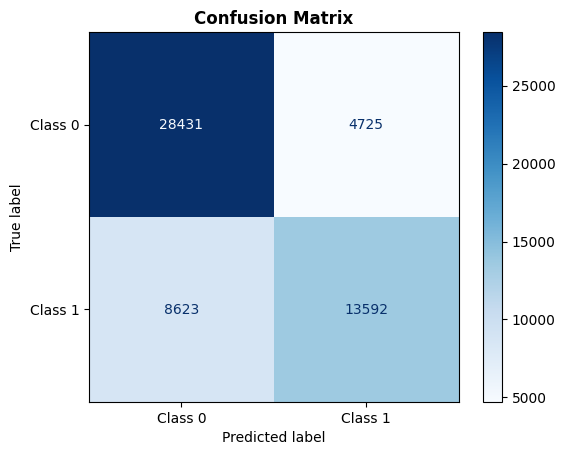

In [453]:
plot_confusion_matrix_NN(prior_labels=VD_label_us, predicted_labels= val_pred_0_us, class_names= class_names)

In [454]:
model_1_us  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_us.shape[1])),
  keras.layers.Dense(256, activation='relu'),
 
  keras.layers.Dropout(0.1),
  keras.layers.Dense(256, activation='relu'),

  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [455]:
history_1_us, model_1_us = fit_NN(TR_set_us, TR_label_us, 0.001, 4096, 500, model_1_us, es_p=None, weights=False)

Epoch 1/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6539 - loss: 0.6155 - val_accuracy: 0.7318 - val_loss: 0.5338
Epoch 2/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7306 - loss: 0.5316 - val_accuracy: 0.7382 - val_loss: 0.5220
Epoch 3/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7388 - loss: 0.5208 - val_accuracy: 0.7425 - val_loss: 0.5165
Epoch 4/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7435 - loss: 0.5155 - val_accuracy: 0.7435 - val_loss: 0.5147
Epoch 5/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7473 - loss: 0.5104 - val_accuracy: 0.7467 - val_loss: 0.5115
Epoch 6/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7452 - loss: 0.5127 - val_accuracy: 0.7479 - val_loss: 0.5107
Epoch 7/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7494 - loss: 0.5076 - val_accuracy: 0.7472 - val_loss: 0.5102
Epoch 8/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7496 - loss: 0.5073 - val_accuracy: 0.7507 - v

In [456]:
model_1_us.summary()

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_28 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_36 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 212,741 (831.02 KB)

 Trainable params: 70,913 (277.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 141,828 (554.02 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


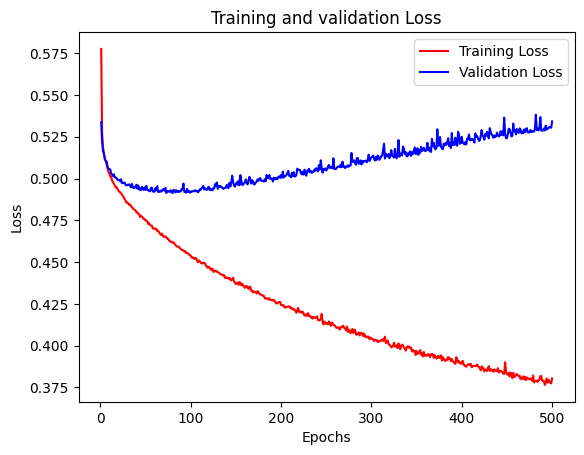

In [457]:
loss_plot(history_1_us)

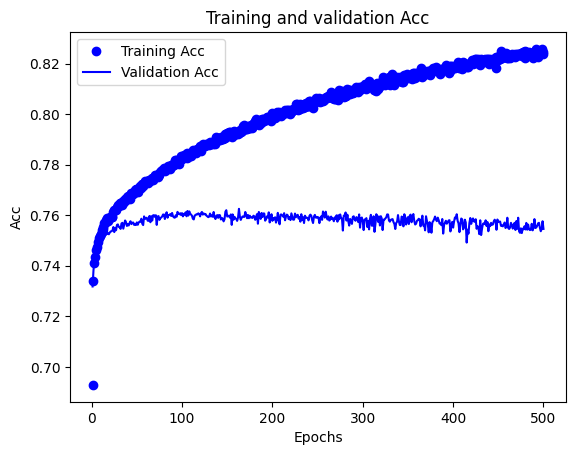

In [458]:
acc_plot(history_1_us)

In [459]:
val_pred_1_us = (model_1_us.predict(x_val_us) > 0.5).astype("int32").ravel()
print(val_pred_1_us)

1731/1731 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step
[0 0 0 ... 0 0 0]


In [460]:
models_us.append(model_1_us)
predictions_us.append(val_pred_1_us)

In [461]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_us, valid_predictions=val_pred_1_us, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.77      0.84      0.81     33156
       top20       0.73      0.63      0.67     22215

    accuracy                           0.76     55371
   macro avg       0.75      0.74      0.74     55371
weighted avg       0.75      0.76      0.75     55371



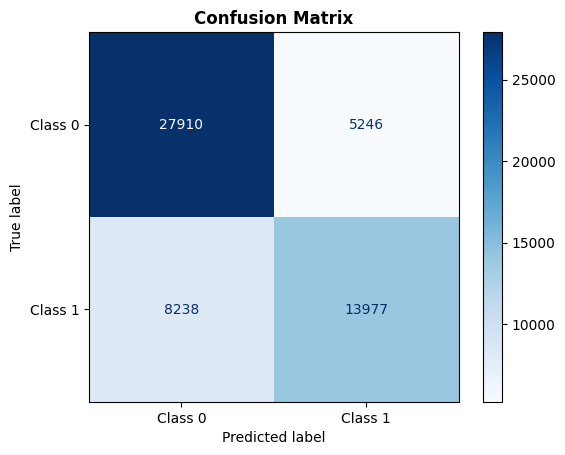

In [462]:
plot_confusion_matrix_NN(prior_labels=VD_label_us, predicted_labels= val_pred_1_us, class_names= class_names)

In [473]:
model_2_us  = keras.models.Sequential([
  keras.layers.Flatten(input_shape=(1,train_set_us.shape[1])),
  keras.layers.Dense(64, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dropout(0.1),
  keras.layers.Dense(64, activation='relu'),
  keras.layers.Dense(1, activation='sigmoid')
])

/Users/lorisgiunta/.pyenv/versions/3.12.4/lib/python3.12/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [474]:
history_2_us, model_2_us = fit_NN(TR_set_us, TR_label_us, 0.009, 256, 300, model_2_us, es_p=None, weights=False)

Epoch 1/300
404/404 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7269 - loss: 0.5383 - val_accuracy: 0.7419 - val_loss: 0.5196
Epoch 2/300
404/404 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7461 - loss: 0.5151 - val_accuracy: 0.7486 - val_loss: 0.5095
Epoch 3/300
404/404 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7471 - loss: 0.5123 - val_accuracy: 0.7467 - val_loss: 0.5102
Epoch 4/300
404/404 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7483 - loss: 0.5090 - val_accuracy: 0.7490 - val_loss: 0.5058
Epoch 5/300
404/404 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7500 - loss: 0.5081 - val_accuracy: 0.7479 - val_loss: 0.5110
Epoch 6/300
404/404 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7545 - loss: 0.5002 - val_accuracy: 0.7504 - val_loss: 0.5046
Epoch 7/300
404/404 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7539 - loss: 0.4999 - val_accuracy: 0.7482 - val_loss: 0.5067
Epoch 8/300
404/404 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7566 - loss: 0.4973 - val_accu

In [475]:
model_2_us.summary()

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_30 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 64)             │         1,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_39 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_40 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,573 (209.27 KB)

 Trainable params: 17,857 (69.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 35,716 (139.52 KB)

/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, loss, 'b', label='Training Loss', c='r')
/var/folders/1q/jqwvs2vs3kg6cxqgnbgg29q40000gn/T/ipykernel_49617/3031977742.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, val_loss, 'b', label='Validation Loss', c='b')


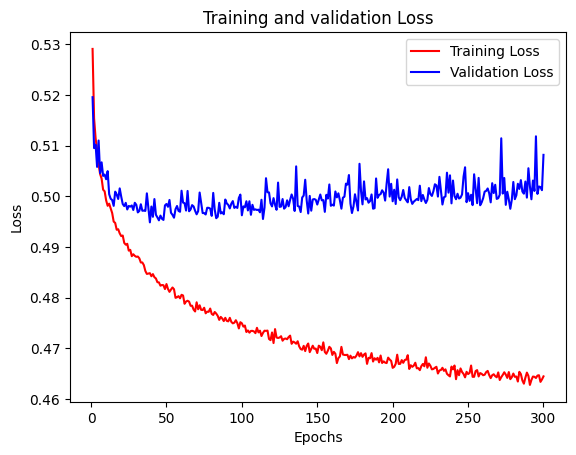

In [476]:
loss_plot(history_2_us)

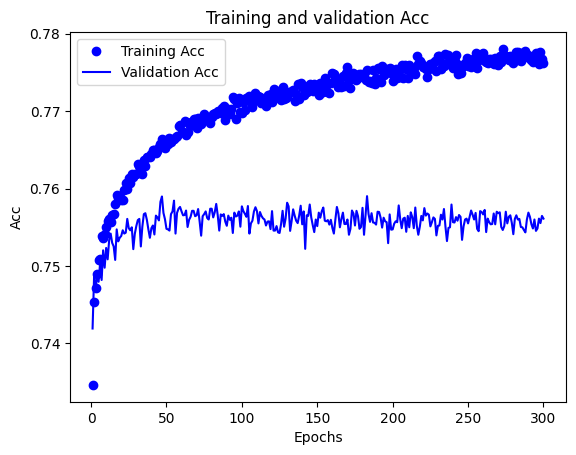

In [477]:
acc_plot(history_2_us)

In [478]:
val_pred_2_us = (model_2_us.predict(x_val_us) > 0.5).astype("int32").ravel()
print(val_pred_2_us)

1731/1731 ━━━━━━━━━━━━━━━━━━━━ 0s 227us/step
[0 0 1 ... 0 1 0]


In [479]:
models_us.append(model_2_us)
predictions_us.append(val_pred_2_us)

In [480]:
print_report(train_label=None, train_predictions=None, validation_label=VD_label_us, valid_predictions=val_pred_2_us, v_or_t="VALIDATION")

VALIDATION SET RESULTS
              precision    recall  f1-score   support

   not top20       0.78      0.82      0.80     33156
       top20       0.72      0.66      0.69     22215

    accuracy                           0.76     55371
   macro avg       0.75      0.74      0.75     55371
weighted avg       0.76      0.76      0.76     55371



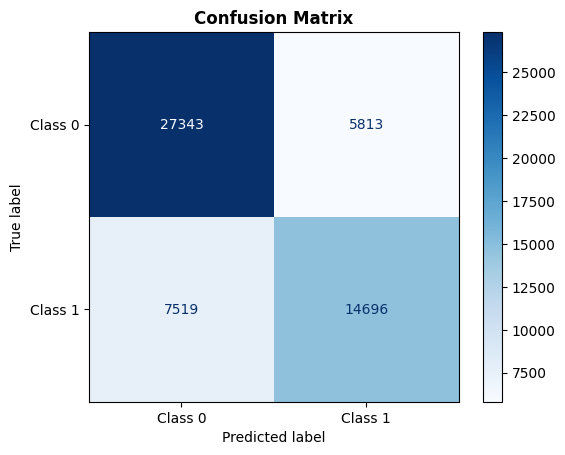

In [481]:
plot_confusion_matrix_NN(prior_labels=VD_label_us, predicted_labels= val_pred_2_us, class_names= class_names)

#### MODEL SELECTION: Dataset undersampled with Random Sampling technique

In [482]:
best_NN_us = compare_f1_score(models=models_us, predictions=predictions_us, true_labels=VD_label_us)

,Model,Macro F1-Score
3,sequential_30,0.745972
2,sequential_29,0.745420
0,sequential_27,0.740282
1,sequential_28,0.740018


The model trained on the undersampled training set using Random Sampling achieves a Macro F1-Score of "0.75" on the validation set.

In [483]:
best_NN_us.name

'sequential_30'

#### MODEL EVALUATION

In [487]:
test_pred_us = (best_NN_us.predict(x_test) > 0.5).astype("int32").ravel()

1019/1019 ━━━━━━━━━━━━━━━━━━━━ 0s 206us/step


In [488]:
print_report(train_label=None, train_predictions=None, validation_label=test_label, valid_predictions=test_pred_us)

TEST SET RESULTS
              precision    recall  f1-score   support

   not top20       0.91      0.84      0.88     28066
       top20       0.34      0.49      0.40      4520

    accuracy                           0.79     32586
   macro avg       0.62      0.67      0.64     32586
weighted avg       0.83      0.79      0.81     32586



1019/1019 ━━━━━━━━━━━━━━━━━━━━ 0s 211us/step
AUC-PR of the classifier: 0.3581
AUC-ROC of the classifier: 0.7445


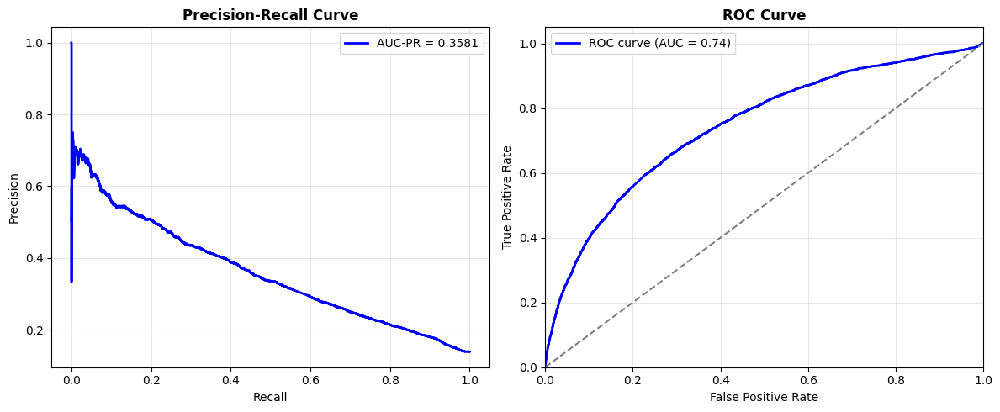

In [489]:
results_NN_us = plot_PR_ROC_AUC(best_NN_us, x_test, test_label)

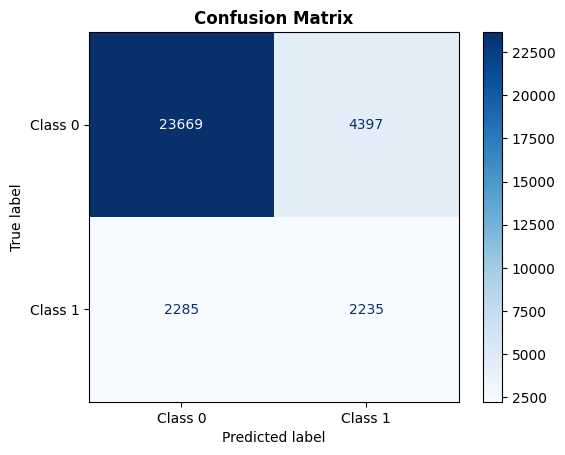

In [490]:
plot_confusion_matrix_NN(prior_labels=test_label, predicted_labels= test_pred_us, class_names= class_names)

#### Save results

In [508]:
config = {
    "Lr": 0.009,
    "Epochs": 300,
    "Batch_size": 256,
    "Weights": False,
    "Layers_dense": 3,
    "Sorted_neurons": [64, 128, 64],
    "Dropout": True
}

best_params_us = config

In [509]:
# save_classification_res('NN_under_sampling', best_params_us, test_pred_us, results_NN_us)

{'method_name': 'NN_under_sampling', 'params': {'Lr': 0.009, 'Epochs': 300, 'Batch_size': 256, 'Weights': False, 'Layers_dense': 3, 'Sorted_neurons': [64, 128, 64], 'Dropout': True}, 'predicted_labels': [True, False, True, True, False, True, True, True, True, True, True, False, True, True, False, True, False, True, True, True, True, False, False, False, False, False, True, True, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, True, True, False, False, True, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, True, False, False, True, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, True, False, False, False, False, False, False, True, False, False, False, False, False, True, False, Tru

## Model Comparison

In [512]:
_, _, nn_smote_predicted_labels, nn_smote_probability_class_res = load_classification_res('NN_SMOTE')

_, _, nn_under_predicted_labels, nn_under_probability_class_res = load_classification_res('NN_under_sampling')

_, _, nn_over_predicted_labels, nn_over_probability_class_res = load_classification_res('NN_over_sampling')

_, _, nn_no_sampling_predicted_labels, nn_no_sampling_probability_class_res = load_classification_res('NN_no_sampling')


### F1 macro NN models comparison

Here, we compare the Macro F1-Score achieved by the best NN models, with one model selected for each type of training set (e.g., unbalanced, balanced with oversampling, balanced with undersampling), on the test set

In [491]:
class ModelInfo:
    def __init__(self, name):
        self.name = name

In [513]:
test_predictions = [
    (nn_no_sampling_predicted_labels, ModelInfo("NN no Sampling")),
    (nn_smote_predicted_labels, ModelInfo("NN SMOTE")),
    (nn_over_predicted_labels, ModelInfo("NN OverSampling")),
    (nn_under_predicted_labels, ModelInfo("NN UnderSampling"))
]
model_infos = [model_info for _, model_info in test_predictions]
model_predictions = [predictions for predictions, _ in test_predictions]
compare_f1_score(model_infos, model_predictions, test_label)

,Model,Macro F1-Score
3,NN UnderSampling,0.638565
2,NN OverSampling,0.631427
1,NN SMOTE,0.621613
0,NN no Sampling,0.609651


### ROC e PR curve comparison

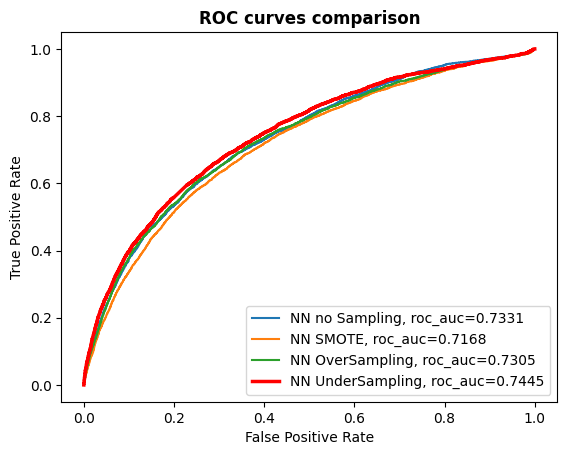

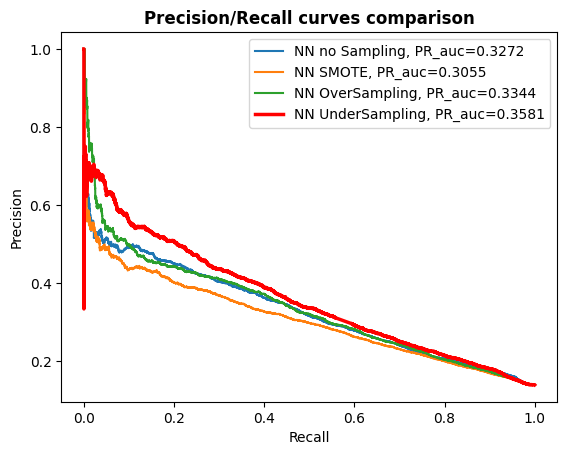

In [514]:
curves = [
    (nn_no_sampling_probability_class_res, "NN no Sampling"),
    (nn_smote_probability_class_res, "NN SMOTE"),
    (nn_over_probability_class_res, "NN OverSampling"),
    (nn_under_probability_class_res, "NN UnderSampling"),
]
compare_roc_curves(curves, title="ROC curves comparison")
compare_pr_curves(curves, title="Precision/Recall curves comparison")